## Merge file 

In [40]:
import csv
import pandas as pd 

# Generate filenames programmatically

path = "/Volumes/T9/XGBoost_OD_TBBE/XGBoostTBBE/100simXgb3_2000mNoStackData/"  # using XGB2_model
files = [path + "new_final_balance_{}.csv".format(i) for i in range(1000)]

merged_filename = "/Volumes/T9/XGBoost_OD_TBBE/XGBoostTraining/StatTestXgb3_2000mNoStack/100simstat_merge_result.csv"

with open(merged_filename, 'w', newline='') as outfile:
    writer = csv.writer(outfile)
    
    for index, filename in enumerate(files):
        with open(filename, 'r') as infile:
            reader = csv.reader(infile)
            
            # Skip header only if it's not the first file
            if index != 0:
                next(reader, None)
                
            # Write rows from current file to the output file
            writer.writerows(reader)

In [43]:
import pandas as pd
import csv

# Generate filenames programmatically
path = (
    "/Volumes/T9/XGBoost_OD_TBBE/XGBoostTBBE/1000simXgb3_2000mData/"  # using XGB2_model
)
files = [path + "new_final_balance_{}.csv".format(i) for i in range(1000)]

# Initialize list to store (filename, final_value) tuples
final_values = []

# Loop over all files
for filename in files:
    # Read file into DataFrame
    df = pd.read_csv(filename)

    # Calculate final value (assuming it's the last value in the DataFrame)
    final_value = df.iloc[-1].values[-1]

    # Append (filename, final_value) tuple to list
    final_values.append((filename, final_value))

# Sort list by final_value in descending order
final_values.sort(key=lambda x: x[1], reverse=True)

# Select top 100 tuples
top_100_files = [filename for filename, value in final_values[:100]]

# Merge top 100 files into one file
merged_filename = "/Volumes/T9/XGBoost_OD_TBBE/XGBoostTraining/StatTestXgb3_2000mNoStack/100simstat_merge_result.csv"

with open(merged_filename, "w", newline="") as outfile:
    writer = csv.writer(outfile)

    for index, filename in enumerate(top_100_files):
        with open(filename, "r") as infile:
            reader = csv.reader(infile)

            # Skip header only if it's not the first file
            if index != 0:
                next(reader, None)

            # Write rows from current file to the output file
            writer.writerows(reader)

## Find average of each betting agents. 

In [1]:
import pandas as pd

# Read the data
df = pd.read_csv(
    "/Volumes/T9/XGBoost_OD_TBBE/XGBoostTraining/StatTestXgb3_2000mNoStack/65stat_merge_result.csv",
    header=None,
)

# Drop the header row
df = df.drop(0)

# Convert all values to float
df = df.astype(float)

# Define ranges for mapping => to group agents with same type/category
ranges = [ 
    (0, 10, 1),
    (10, 20, 2),
    (20, 30, 3),
    (30, 40, 4),
    (40, 50, 5),
    (50, 55, 6),
    (55, 60, 7),
    (60, 65, 8),
    (65, 70, 9),
]

# Create a mapping function based on ranges
def get_mapping(col):
    for start, end, category in ranges:
        if start <= col < end:
            return category

# Create a new DataFrame with mapped columns
mapped_df = df.copy()
mapped_df.columns = [get_mapping(col) for col in df.columns]

# Group by column categories and compute the mean
averaged_df = mapped_df.groupby(mapped_df.columns, axis=1).mean()
averaged_df = averaged_df - 100000000

print(averaged_df)

               1            2          3           4           5            6  \
1   -1715.818234  1065.422429 -28.909961 -240.717561   61.239805  1789.230839   
2   -1095.300000 -7659.750000  -3.000000 -685.200000    4.500000  6027.000000   
3   -1251.000000 -1795.555495  -6.686581 -100.835341   21.030113   -45.670819   
4    3415.580013 -4476.000000  17.115823 -744.000000  -46.097470 -1368.658156   
5    -725.748894   258.097842 -17.250000 -381.336994   42.686301  -293.041943   
..           ...          ...        ...         ...         ...          ...   
96   -373.960215 -2797.257205 -25.619398  -43.650000   14.696989 -1010.729205   
97   -822.100000  8254.200000 -17.100000 -308.700000  259.050000 -1176.492414   
98  -1223.176756  1010.603452 -14.100000 -380.551895   99.300000 -1146.249603   
99    -41.100000  -667.350000  -7.650000 -672.300000   26.250000 -2766.300000   
100 -1265.400000 -3208.950000 -18.000000 -615.000000   24.150000 -1212.900000   

               7           

/var/folders/56/1wgtsx053h5_2lvs_fqprbsw0000gn/T/ipykernel_10994/299683758.py:39: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  averaged_df = mapped_df.groupby(mapped_df.columns, axis=1).mean()


In [2]:
import pandas as pd

# Read the data
df = pd.read_csv(
    "/Volumes/T9/XGBoost_OD_TBBE/XGBoostTraining/StatTestXgb3_2000mNoStack/65stat_merge_result.csv",
    header=None,
)
# Drop the header row
df = df.drop(0)

# Convert all values to float
df = df.astype(float)

# Define ranges for mapping => to group agents with same type/category
ranges = [
    (0, 10, 1),
    (10, 20, 2),
    (20, 30, 3),
    (30, 40, 4),
    (40, 50, 5),
    (50, 55, 6),
    (55, 60, 7),
    (60, 65, 8),
    (65, 70, 9),
]


# Create a mapping function based on ranges
def get_mapping(col):
    for start, end, category in ranges:
        if start <= col < end:
            return category


# Create a new DataFrame with mapped columns
mapped_df = df.copy()
mapped_df.columns = [get_mapping(col) for col in df.columns]

# Group by column categories and compute the mean
averaged_df = mapped_df.groupby(mapped_df.columns, axis=1).mean()
averaged_df = averaged_df - 100000000

# Print the total averaged balance for XGBoost1 and XGBoost2
xgboost1_total_balance = averaged_df.iloc[:, 6].sum()
xgboost2_total_balance = averaged_df.iloc[:, 7].sum()
xgboost3_total_balance = averaged_df.iloc[:, 8].sum()

print("Total Averaged Balance for XGBoost1:", xgboost1_total_balance)
print("Total Averaged Balance for XGBoost2:", xgboost2_total_balance)
print("Total Averaged Balance for XGBoost3:", xgboost3_total_balance)

Total Averaged Balance for XGBoost1: 40710.32368308306
Total Averaged Balance for XGBoost2: 42577.3077417016
Total Averaged Balance for XGBoost3: 52637.70082357526


/var/folders/56/1wgtsx053h5_2lvs_fqprbsw0000gn/T/ipykernel_10994/515214769.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  averaged_df = mapped_df.groupby(mapped_df.columns, axis=1).mean()


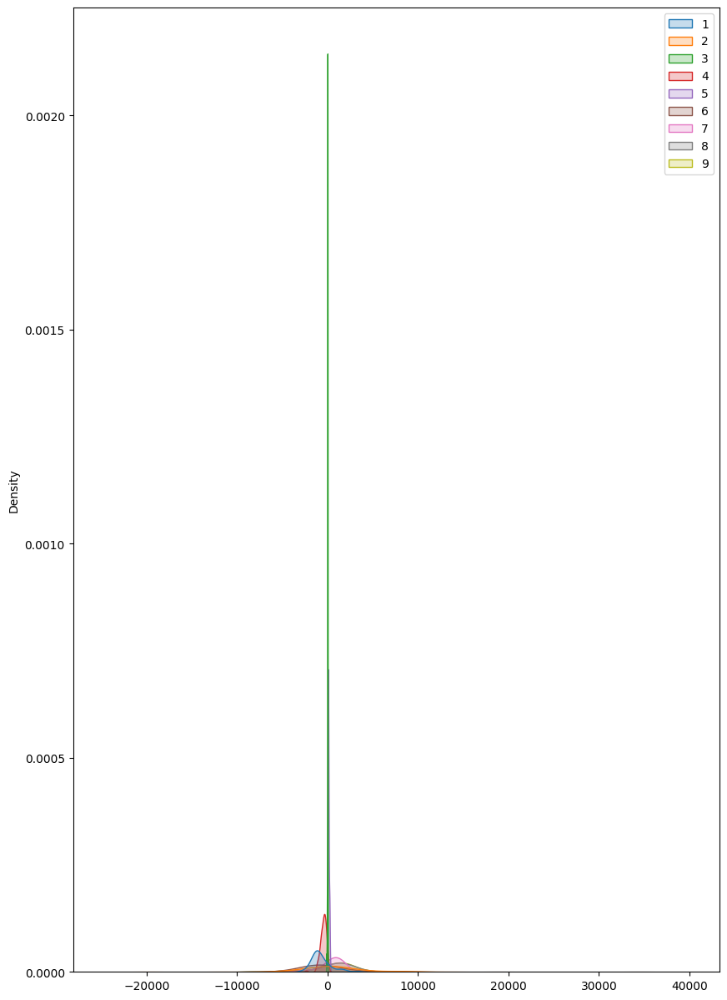

In [3]:
import seaborn as sns 
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 15))
distributionPlot = sns.kdeplot(data=averaged_df,fill=True)
plt.show()


## Statistical Testing

In [4]:
from scipy import stats

# Last two agents
xgboost1_avg_balance = averaged_df.iloc[:, -3]  # third last column
xgboost2_avg_balance = averaged_df.iloc[:, -2]  # second column
xgboost3_avg_balance = averaged_df.iloc[:, -1]  # Last column

# List to hold the two agents
agents = [xgboost1_avg_balance, xgboost2_avg_balance, xgboost3_avg_balance]

# Loop through the agent
for agent in agents:
    # Loop through columns 1 to third last for other agents
    for col_index in range(averaged_df.shape[1] - 3):
        other_agent_balance = averaged_df.iloc[:, col_index]
        # Check normality for both columns
        _, pvalue_agent = stats.shapiro(agent)
        _, pvalue_other_agent = stats.shapiro(other_agent_balance)
        print("P_value_agent", pvalue_agent)
        print("pvalue_other_agent ", pvalue_other_agent)
        # If both are normally distributed
        if pvalue_agent > 0.05 and pvalue_other_agent > 0.05:
            print("normal")
            statistic, pvalue = stats.ttest_rel(agent, other_agent_balance)
            if pvalue < 0.05:
                print("There is a statistically significant difference")
            else:
                print("There isn't a statistically significant difference")
        else:
            print("not normal")
            # If either or both are not normally distributed
            statistic, pvalue = stats.wilcoxon(agent, other_agent_balance)
            if pvalue < 0.05:
                print("There is a statistically significant difference")
                print("P-Value", pvalue)
                print("")
            else:
                print("There isn't a statistically significant difference")

P_value_agent 5.016822841002034e-06
pvalue_other_agent  3.3115925240036886e-07
not normal
There is a statistically significant difference
P-Value 2.241363978256441e-07

P_value_agent 5.016822841002034e-06
pvalue_other_agent  1.4999002068244965e-06
not normal
There isn't a statistically significant difference
P_value_agent 5.016822841002034e-06
pvalue_other_agent  6.526796874925353e-08
not normal
There is a statistically significant difference
P-Value 0.00014710248957640129

P_value_agent 5.016822841002034e-06
pvalue_other_agent  6.501998518989407e-07
not normal
There is a statistically significant difference
P-Value 2.160219772158601e-07

P_value_agent 5.016822841002034e-06
pvalue_other_agent  5.529689775616735e-05
not normal
There is a statistically significant difference
P-Value 0.0012144533585449683

P_value_agent 5.016822841002034e-06
pvalue_other_agent  7.308943256340415e-16
not normal
There is a statistically significant difference
P-Value 0.0015973939300420173

P_value_agent 1.3

# Stat test with plotting

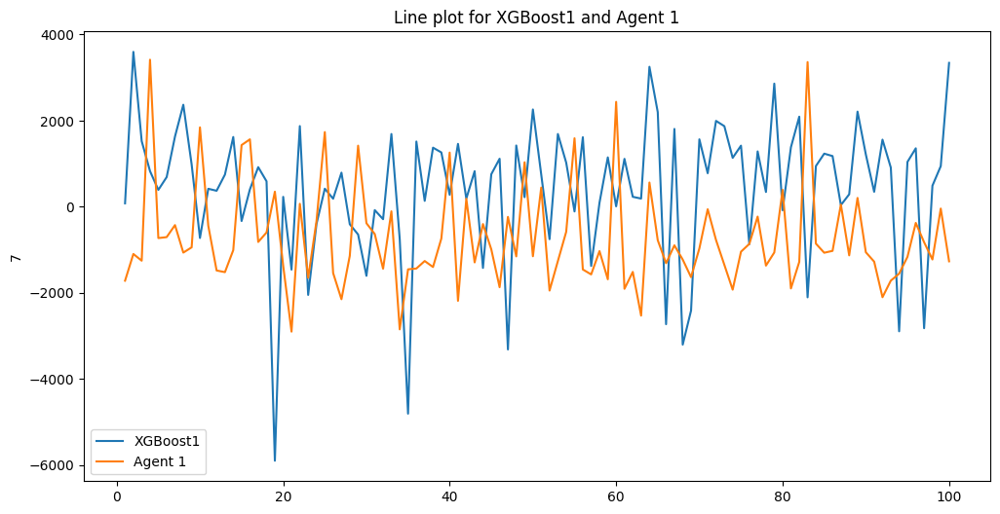

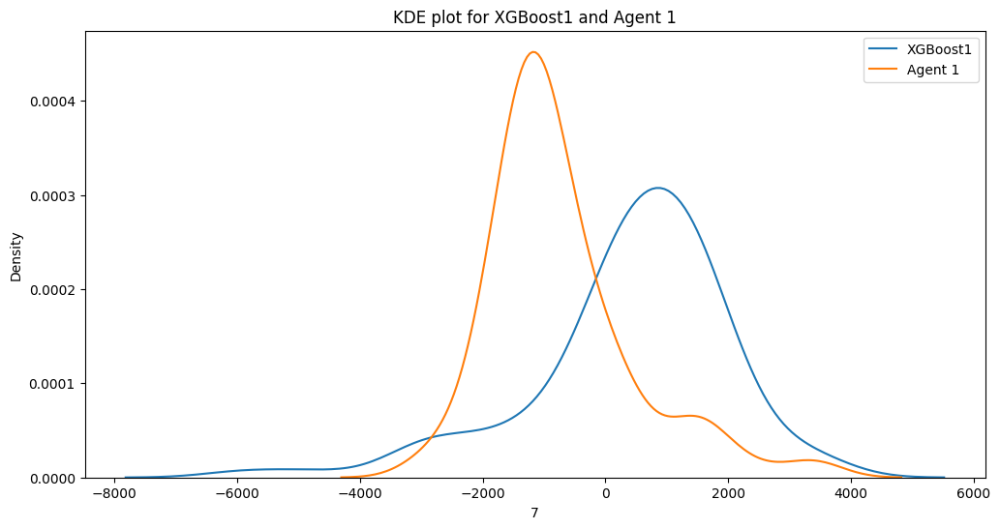

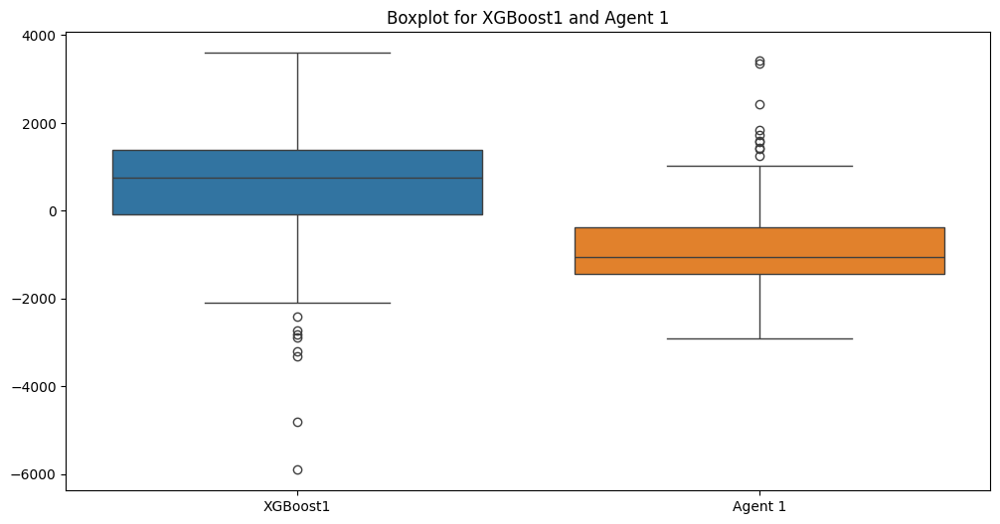

P_value_XGBoost1 5.016822841002034e-06
pvalue_other_agent  3.3115925240036886e-07
not normal
There is a statistically significant difference
P-Value 1.0878362175923719e-10



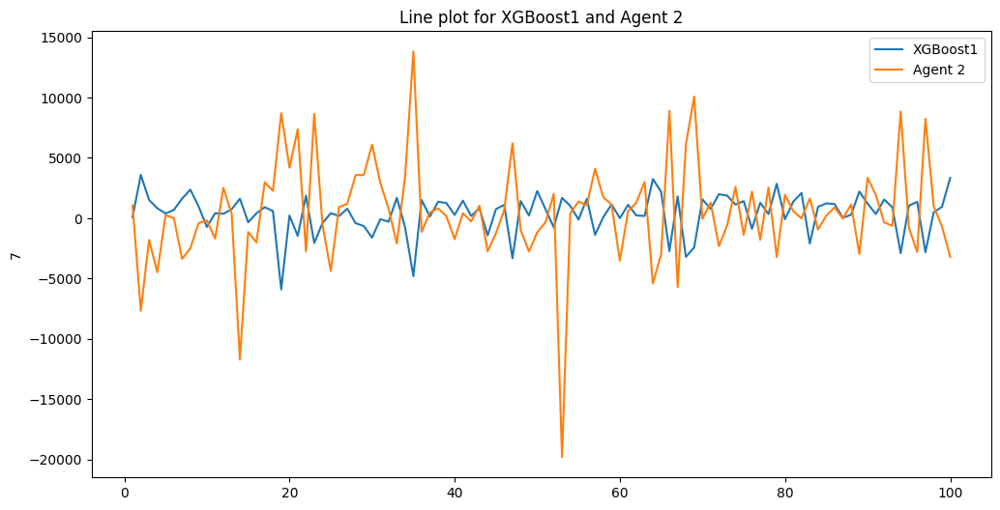

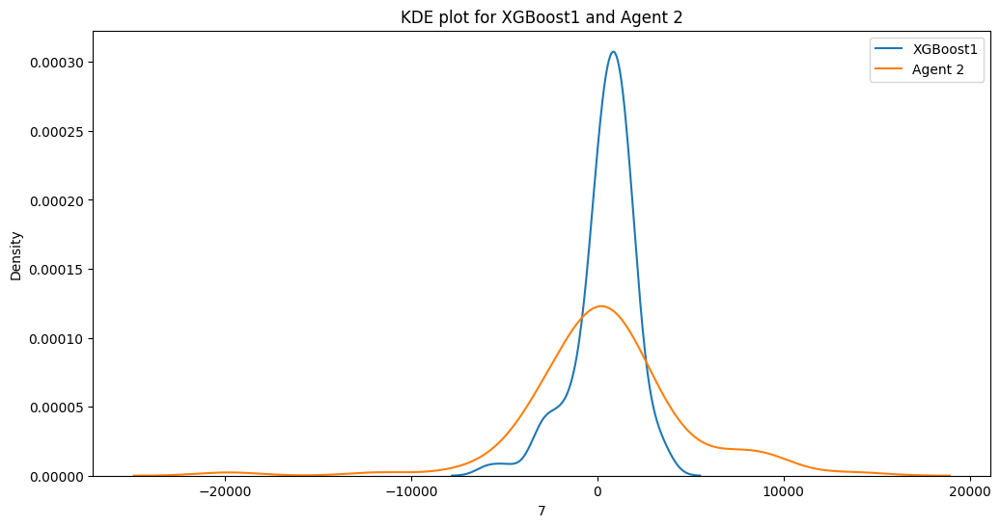

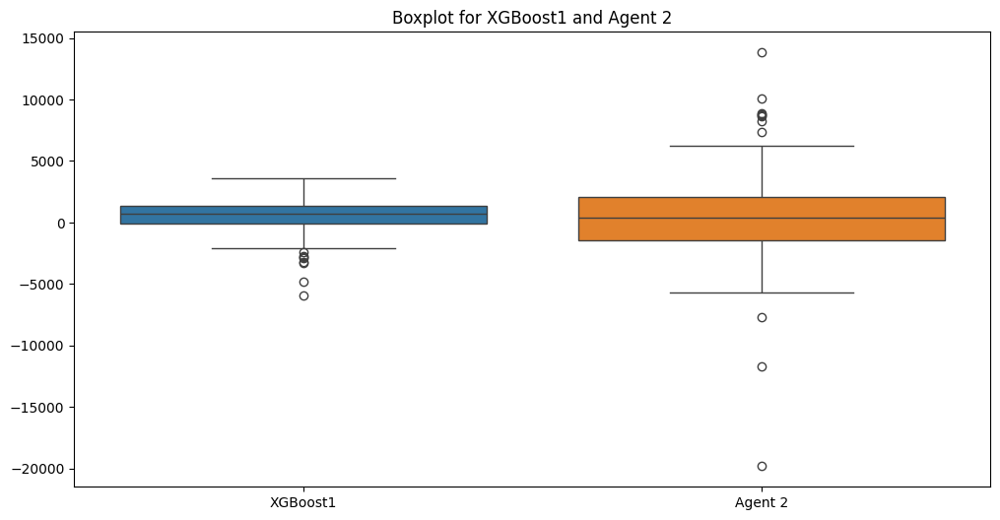

P_value_XGBoost1 5.016822841002034e-06
pvalue_other_agent  1.4999002068244965e-06
not normal
There isn't a statistically significant difference


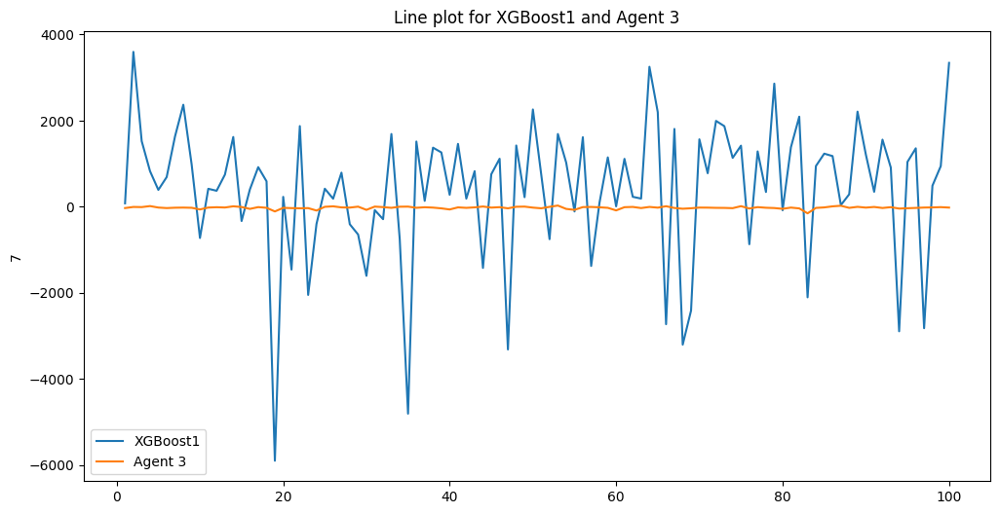

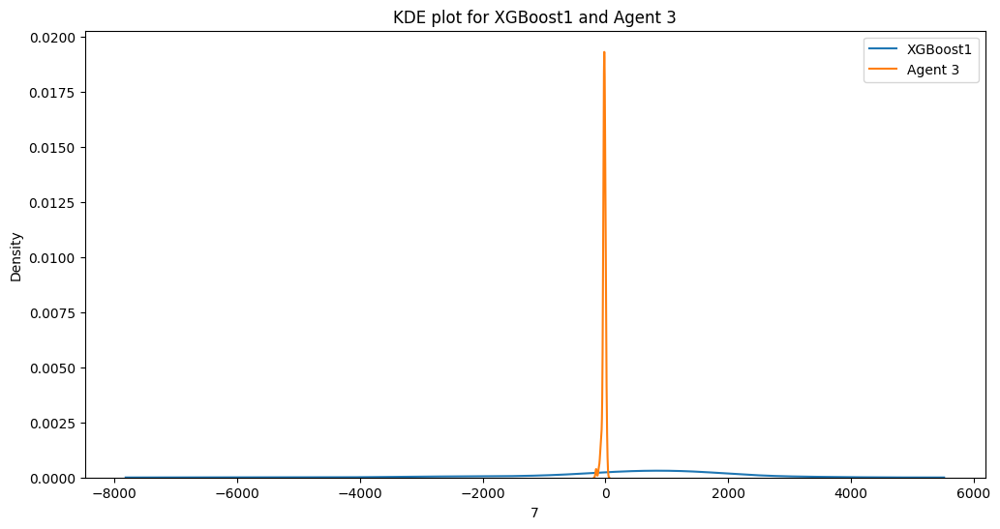

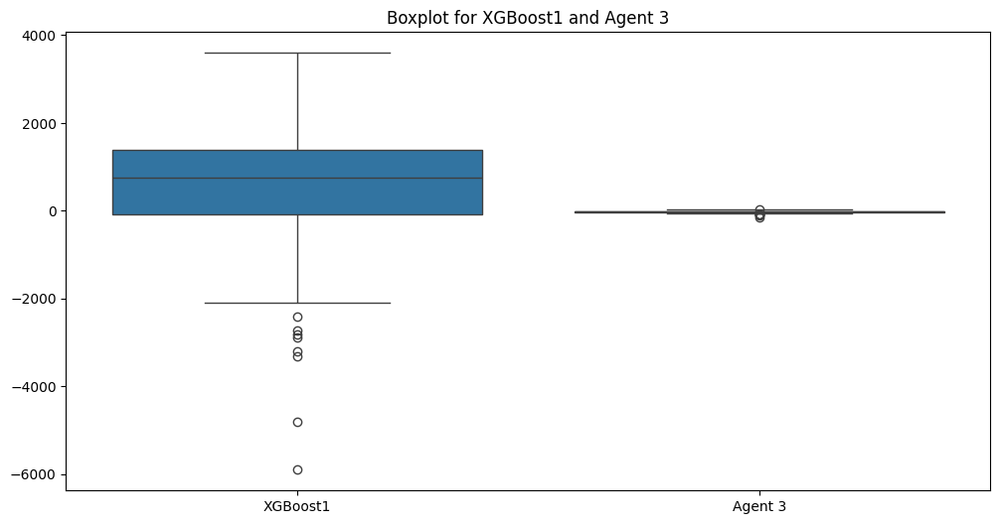

P_value_XGBoost1 5.016822841002034e-06
pvalue_other_agent  6.526796874925353e-08
not normal
There is a statistically significant difference
P-Value 4.481548863380454e-09



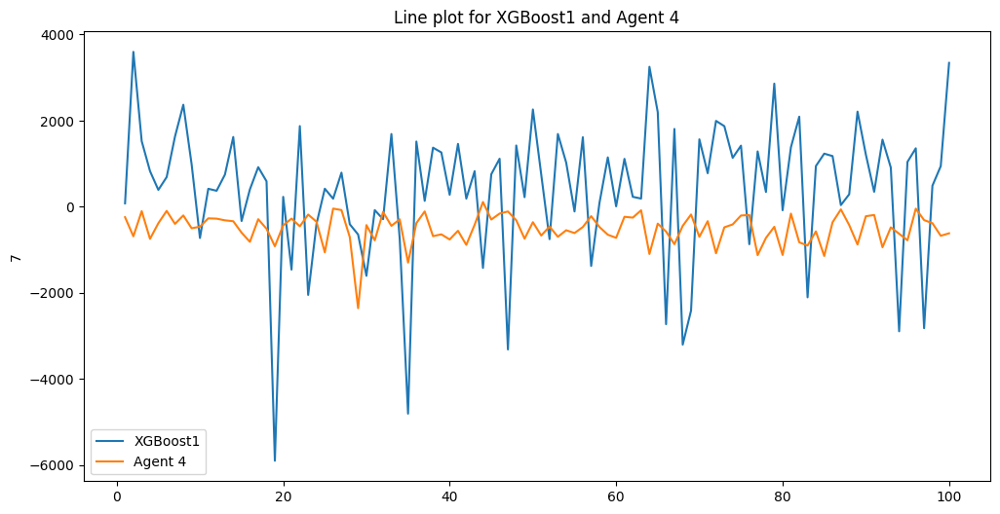

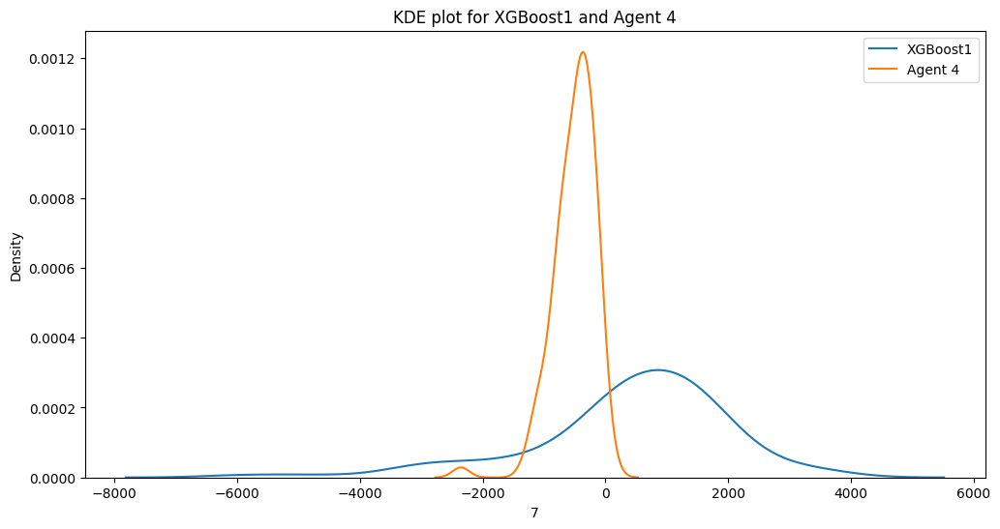

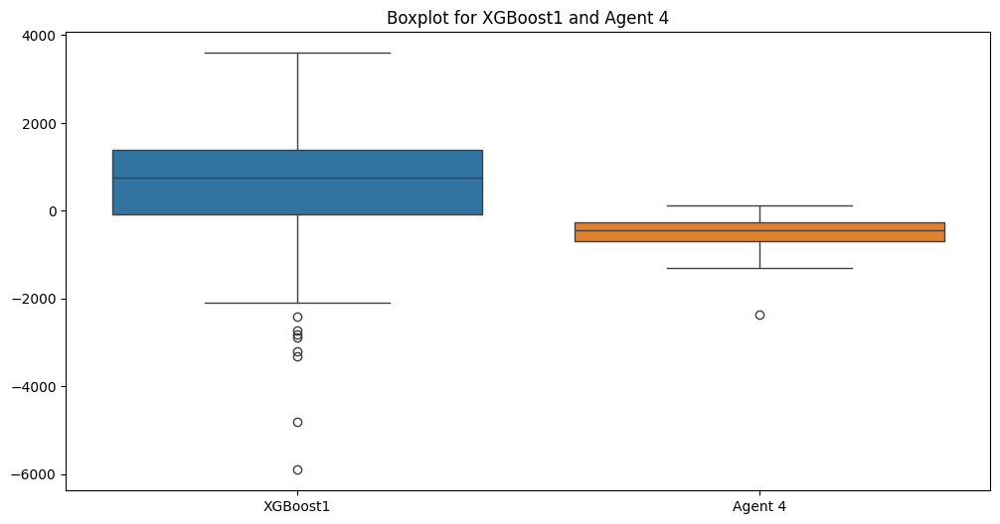

P_value_XGBoost1 5.016822841002034e-06
pvalue_other_agent  6.501998518989407e-07
not normal
There is a statistically significant difference
P-Value 1.1135688416166574e-13



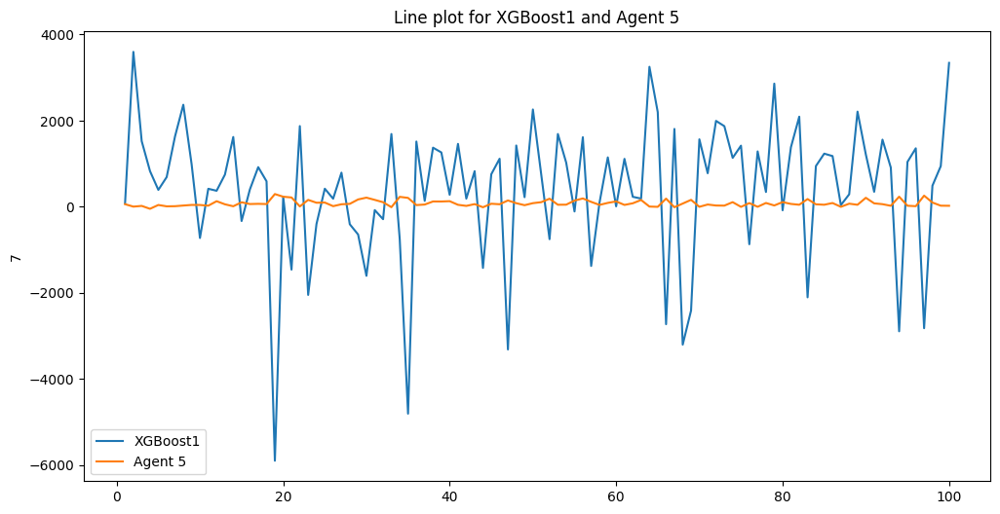

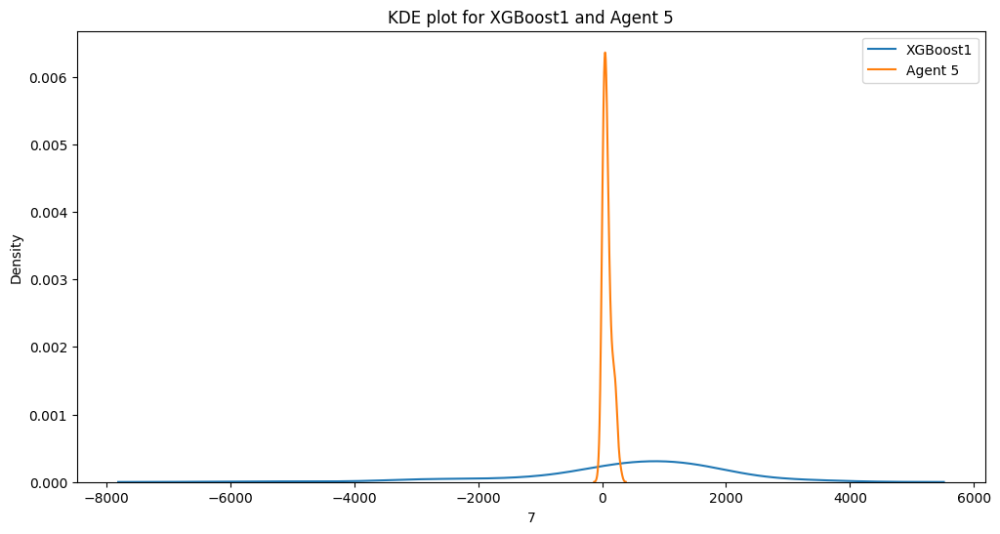

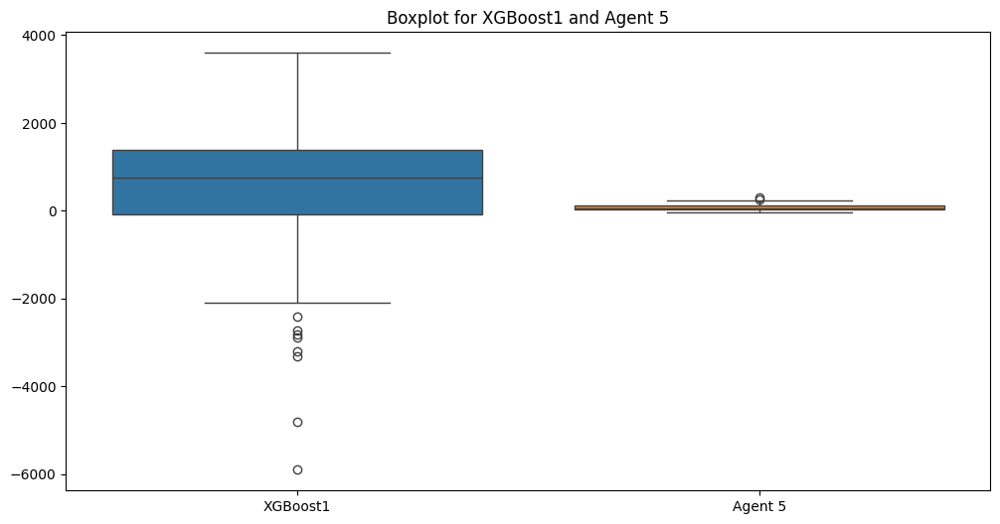

P_value_XGBoost1 5.016822841002034e-06
pvalue_other_agent  5.529689775616735e-05
not normal
There is a statistically significant difference
P-Value 2.899038876536004e-07



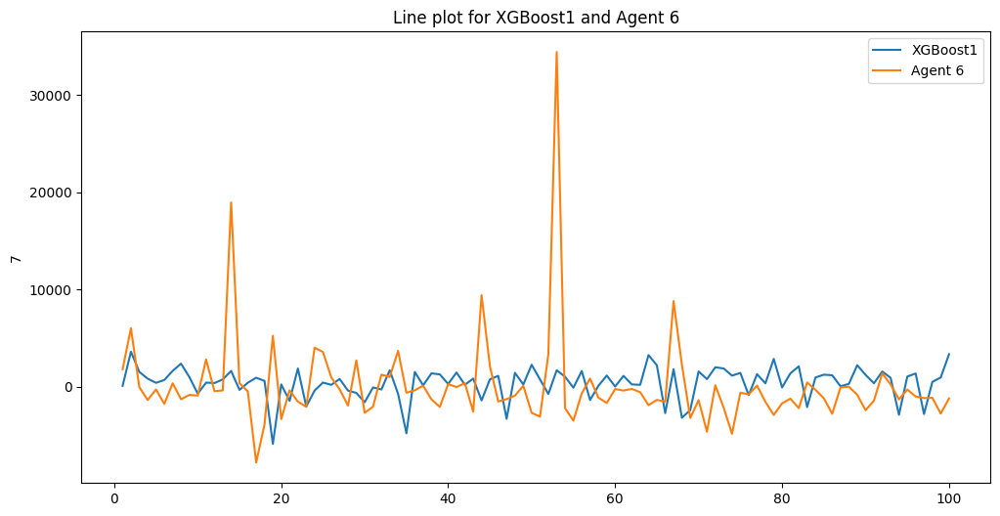

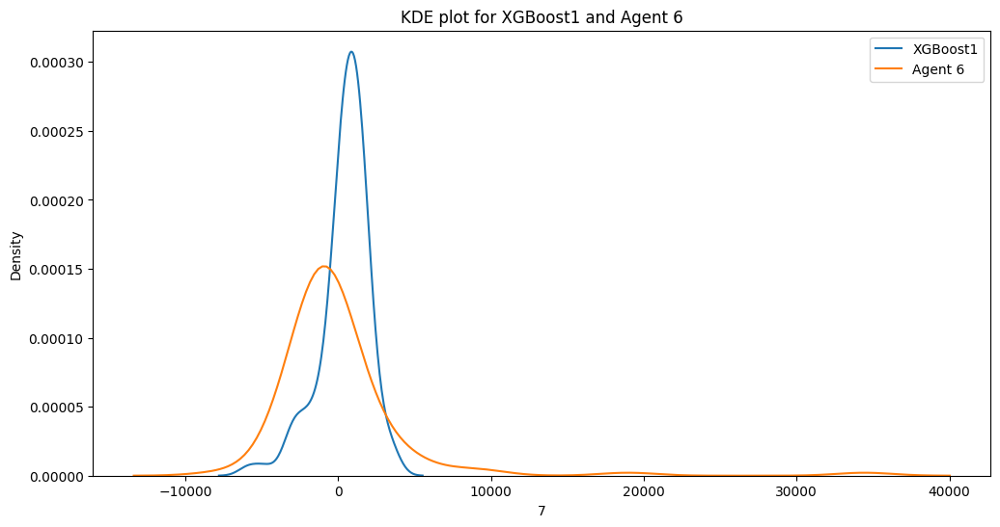

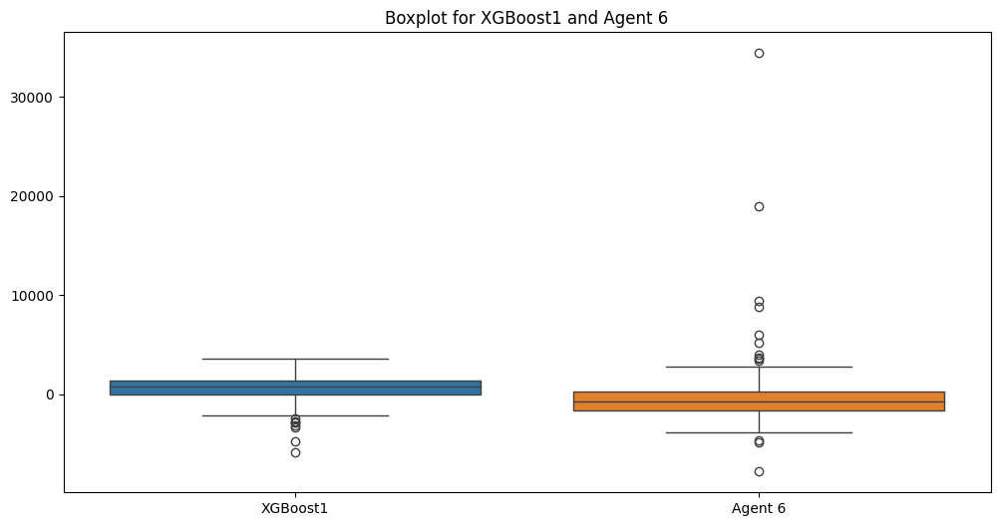

P_value_XGBoost1 5.016822841002034e-06
pvalue_other_agent  7.308943256340415e-16
not normal
There is a statistically significant difference
P-Value 2.227322510044012e-06



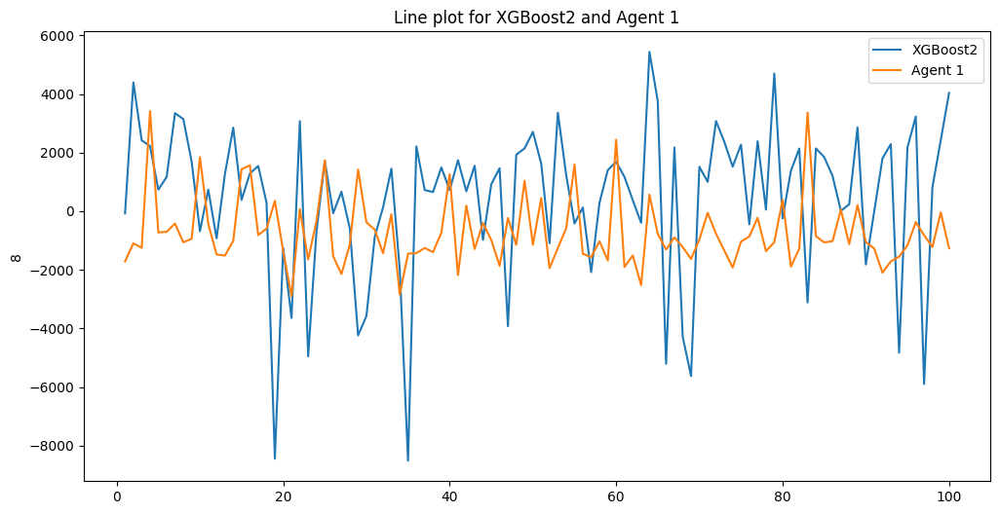

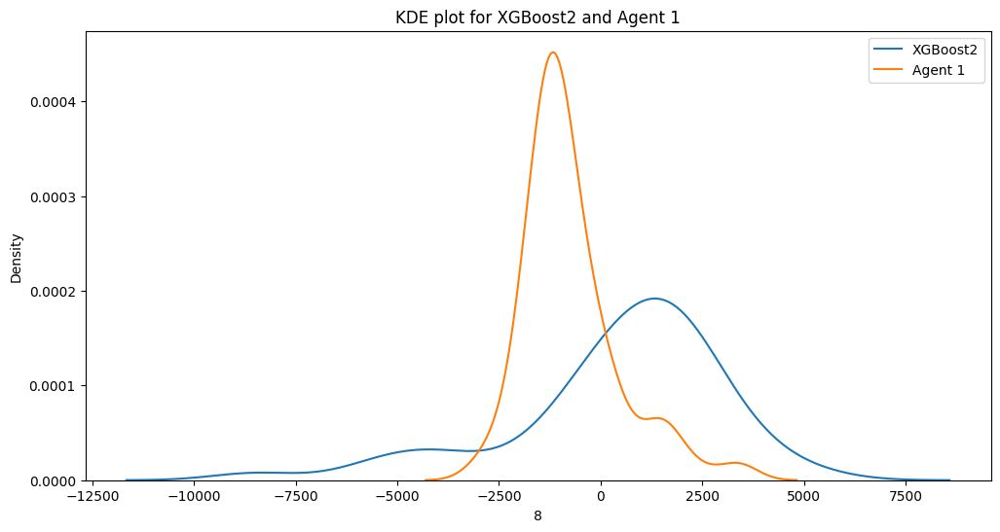

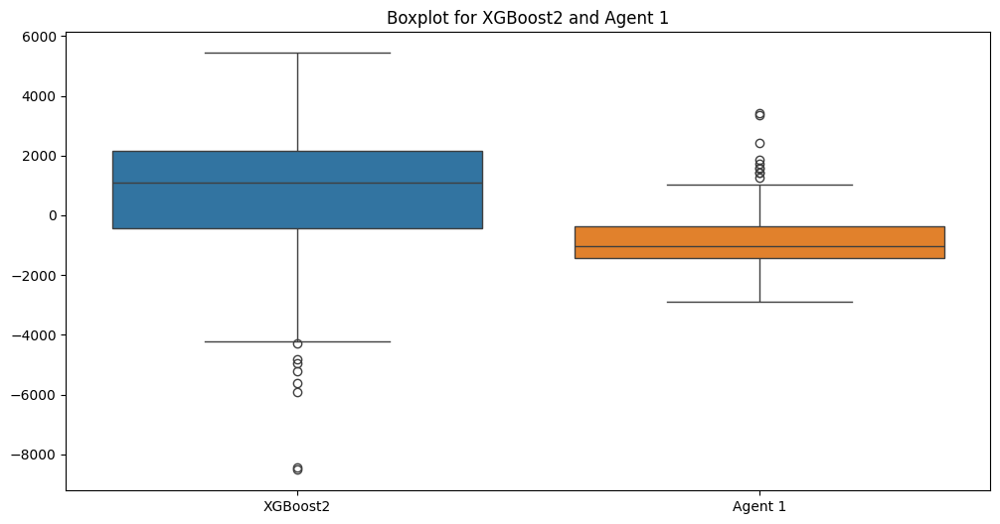

P_value_XGBoost2 1.3294134009349506e-06
pvalue_other_agent  3.3115925240036886e-07
not normal
There is a statistically significant difference
P-Value 2.6080282153148913e-09



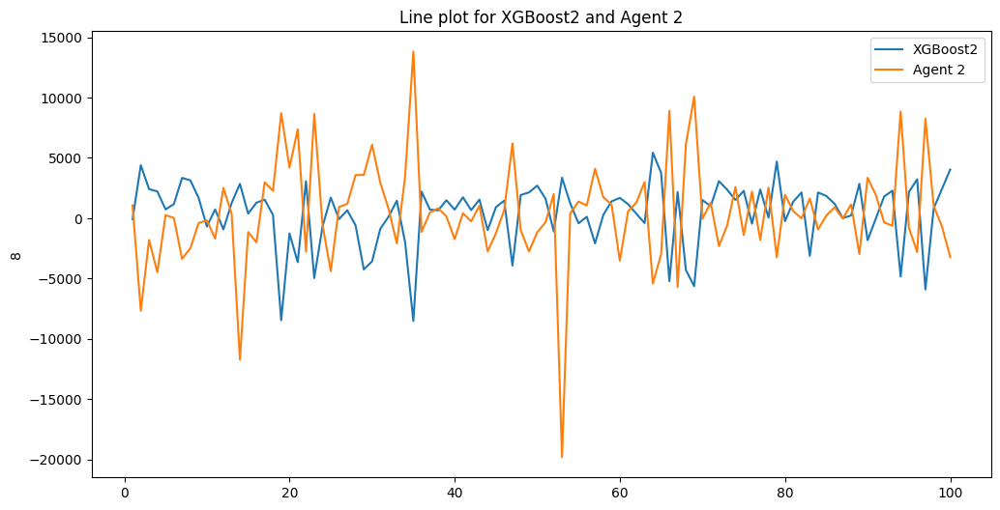

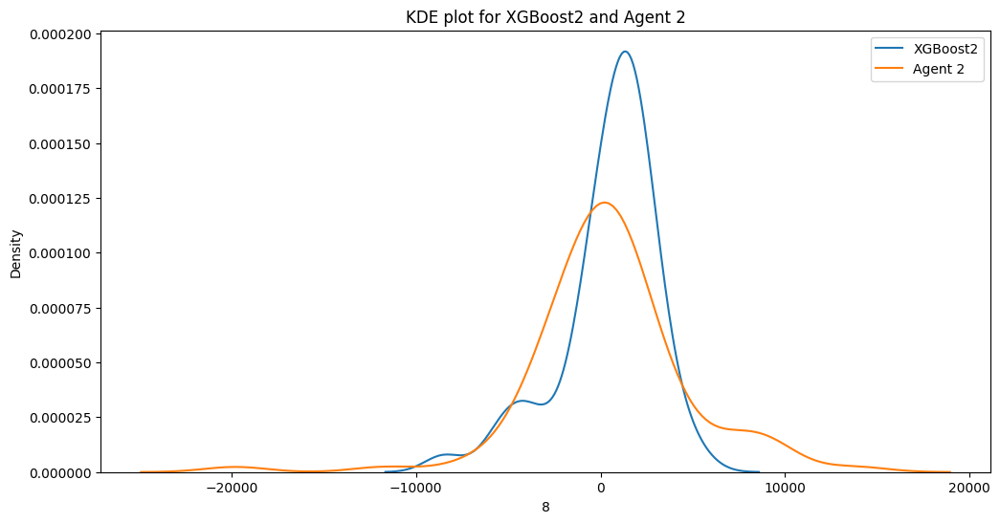

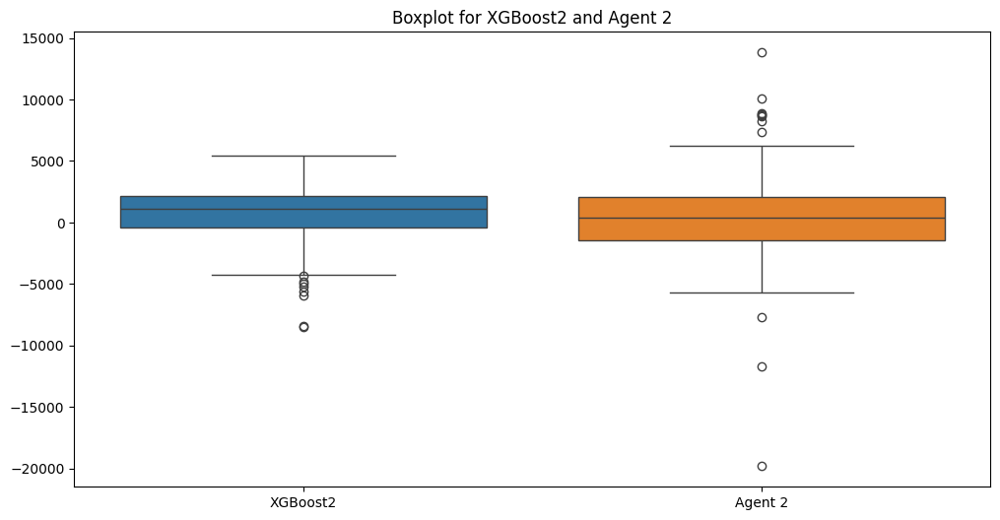

P_value_XGBoost2 1.3294134009349506e-06
pvalue_other_agent  1.4999002068244965e-06
not normal
There isn't a statistically significant difference


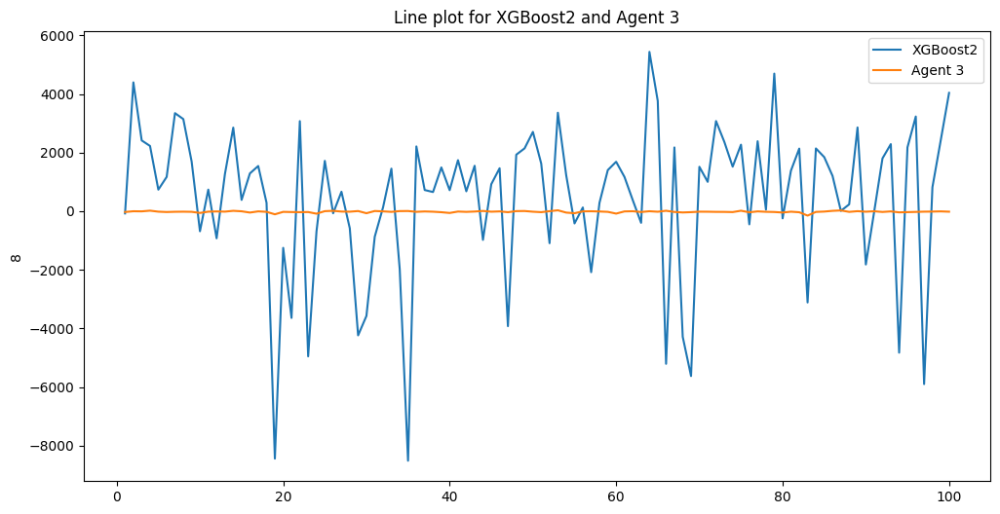

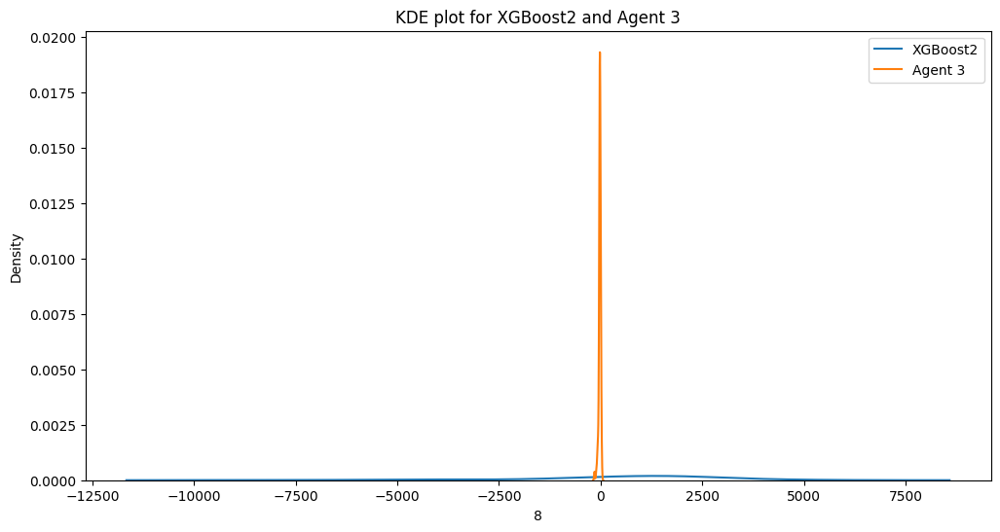

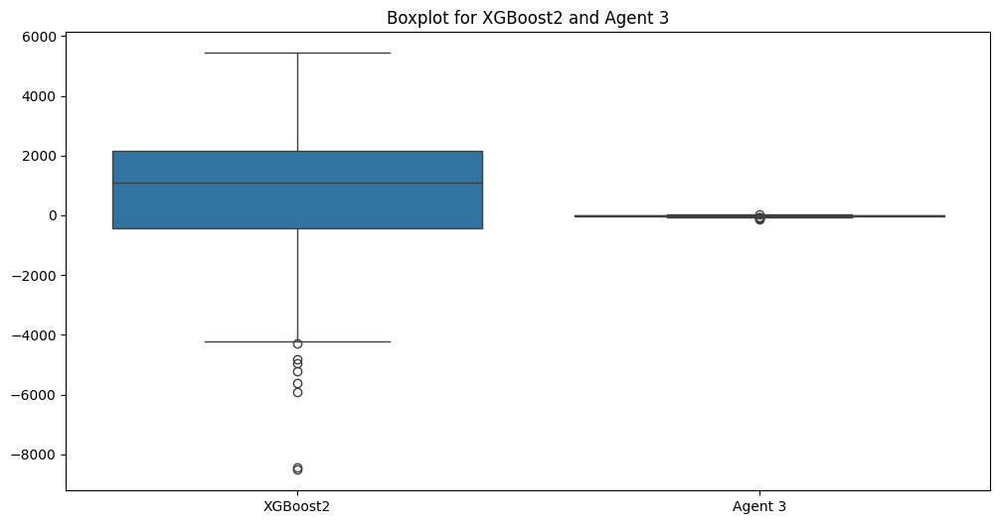

P_value_XGBoost2 1.3294134009349506e-06
pvalue_other_agent  6.526796874925353e-08
not normal
There is a statistically significant difference
P-Value 2.022379705429833e-06



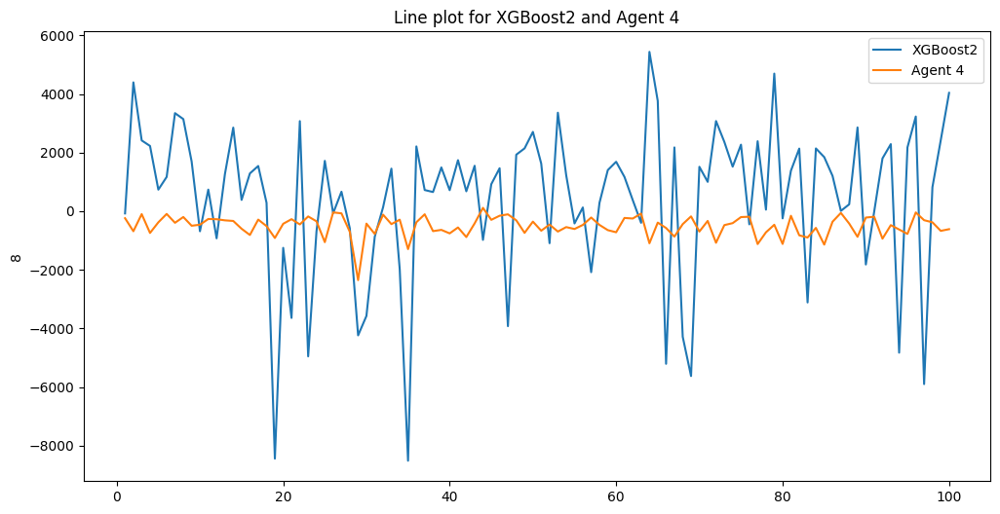

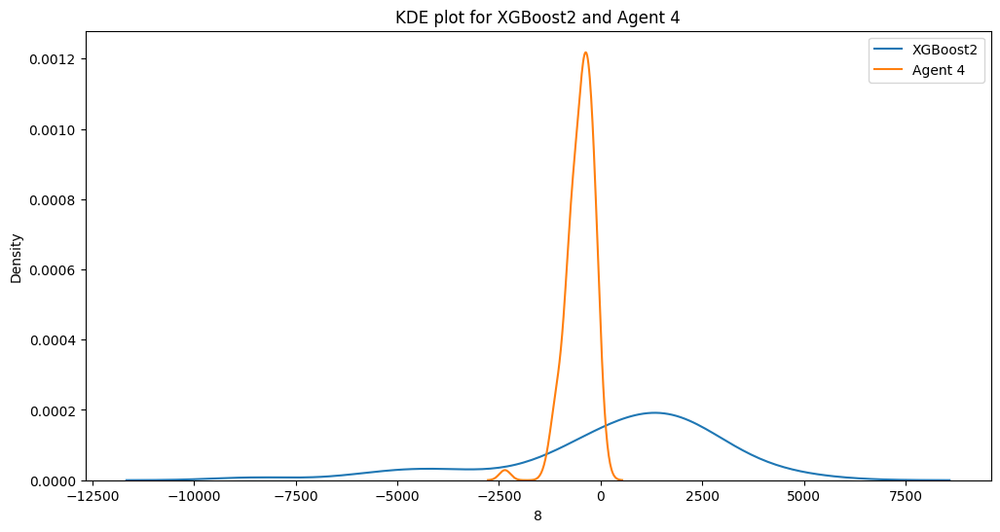

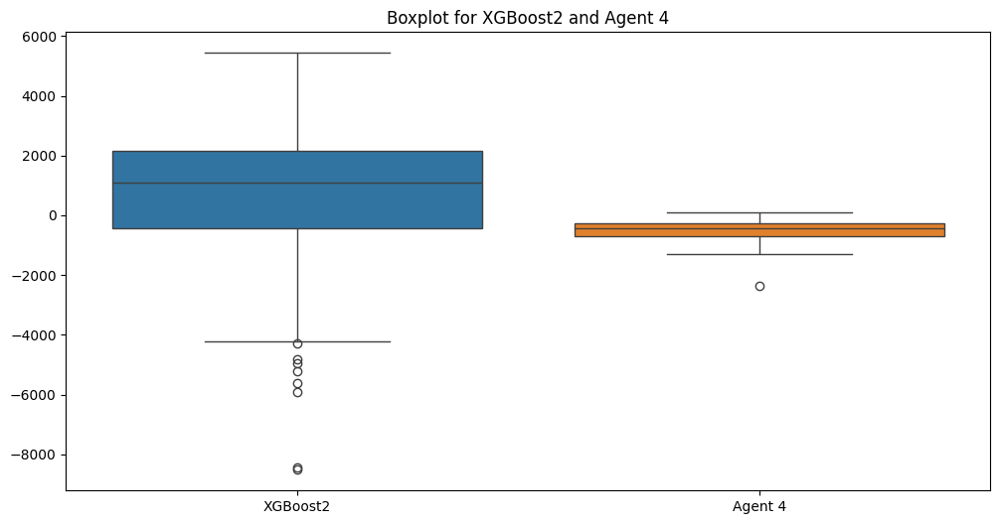

P_value_XGBoost2 1.3294134009349506e-06
pvalue_other_agent  6.501998518989407e-07
not normal
There is a statistically significant difference
P-Value 4.229757208904003e-10



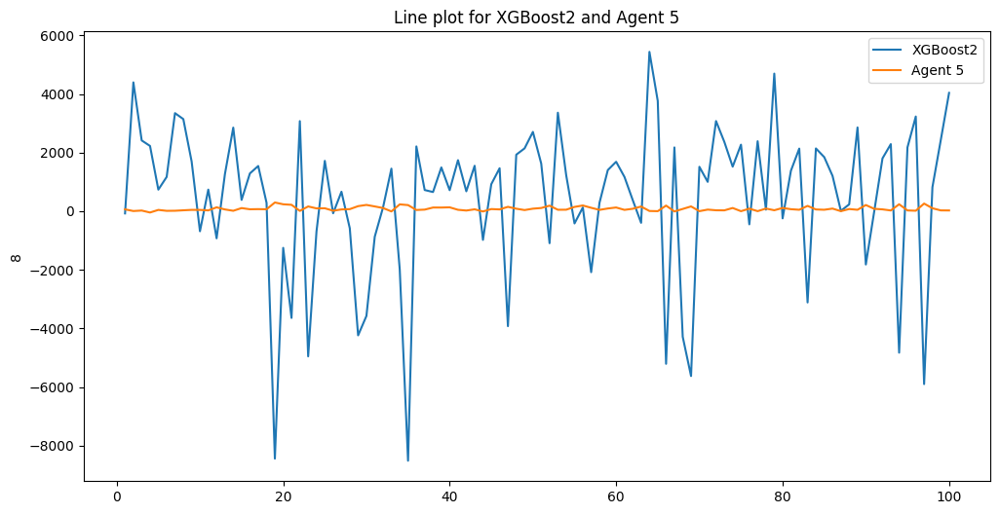

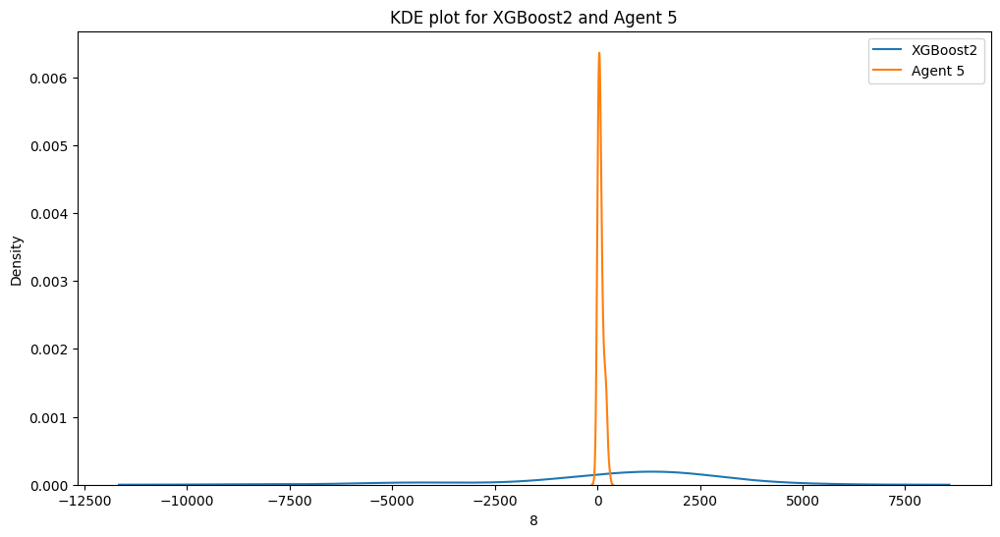

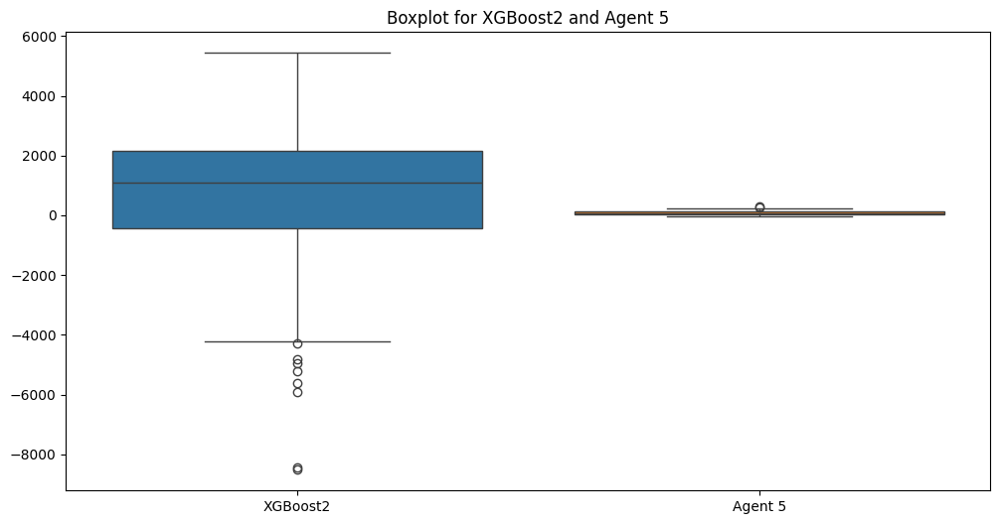

P_value_XGBoost2 1.3294134009349506e-06
pvalue_other_agent  5.529689775616735e-05
not normal
There is a statistically significant difference
P-Value 3.116852321991479e-05



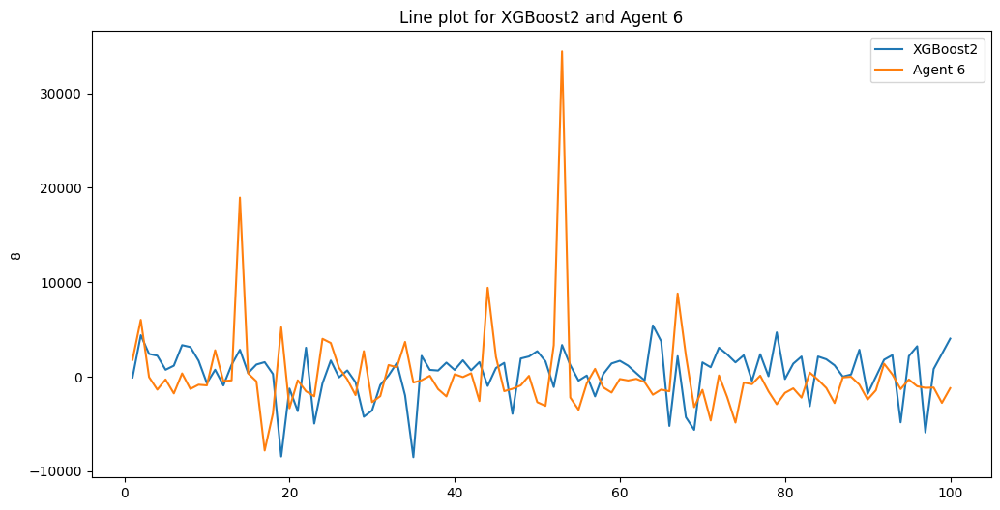

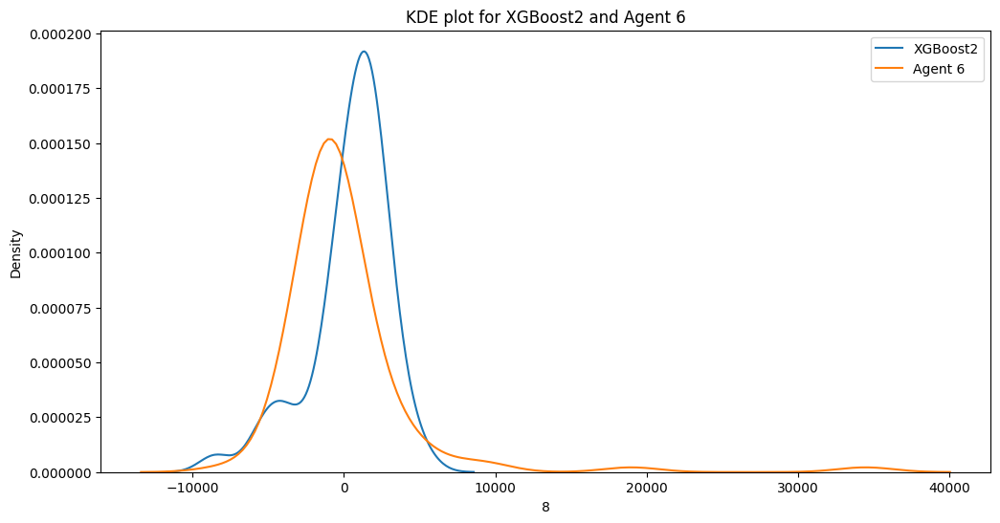

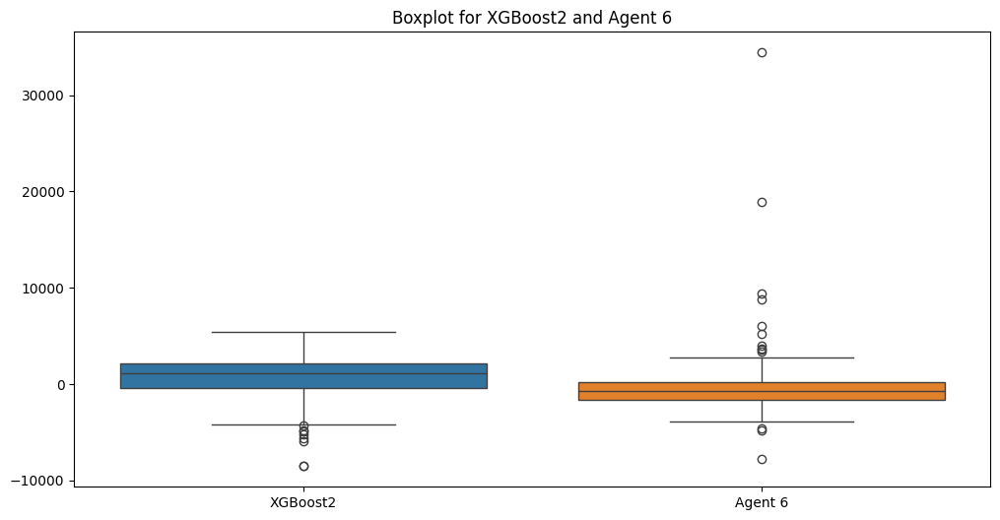

P_value_XGBoost2 1.3294134009349506e-06
pvalue_other_agent  7.308943256340415e-16
not normal
There is a statistically significant difference
P-Value 2.1350824571438758e-05



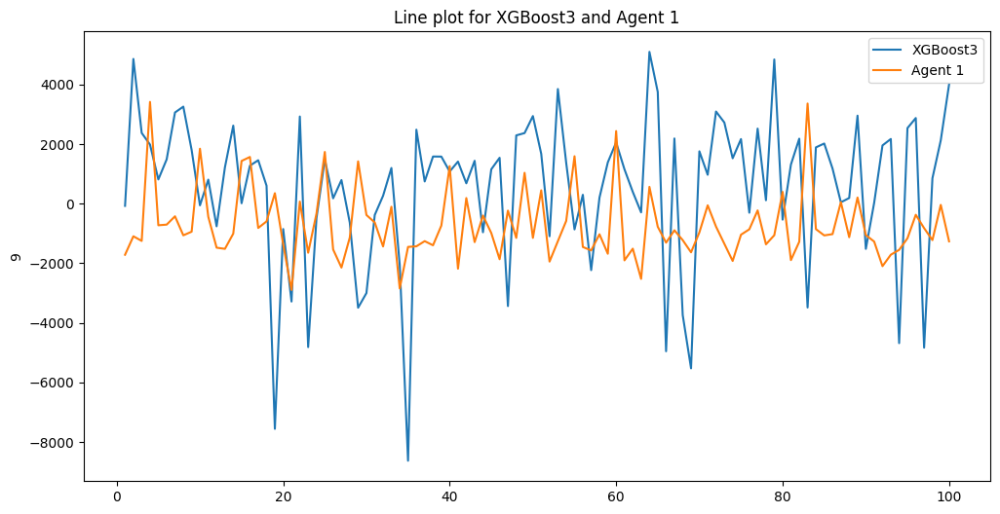

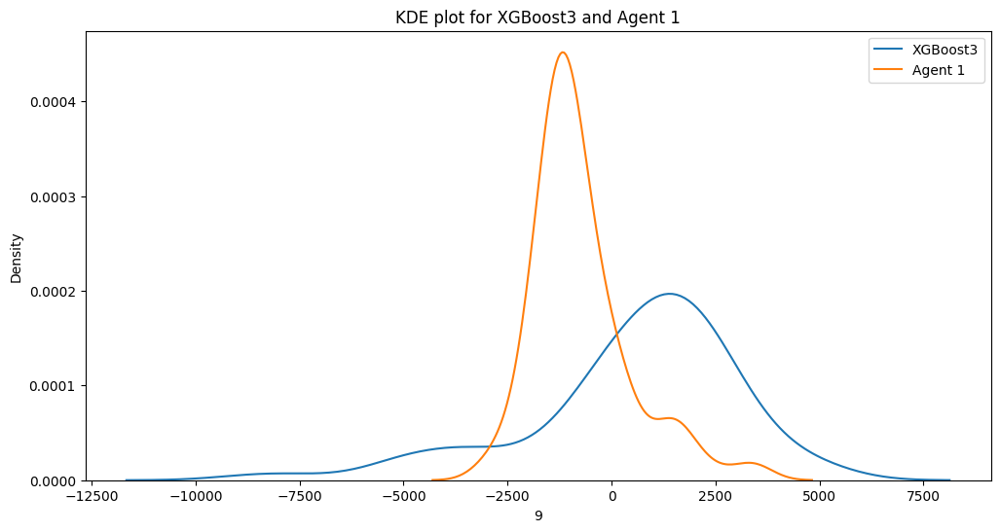

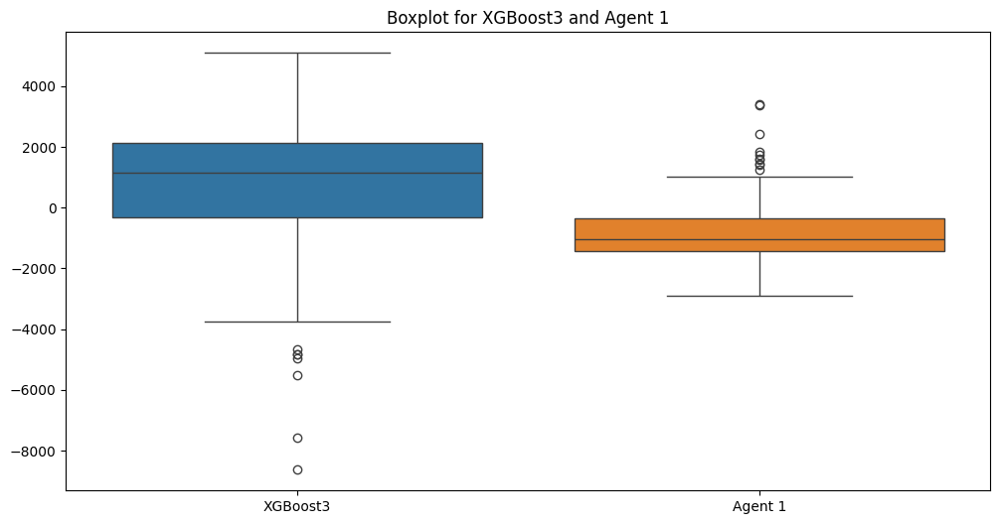

P_value_XGBoost3 2.982896249762993e-06
pvalue_other_agent  3.3115925240036886e-07
not normal
There is a statistically significant difference
P-Value 8.176746360439757e-10



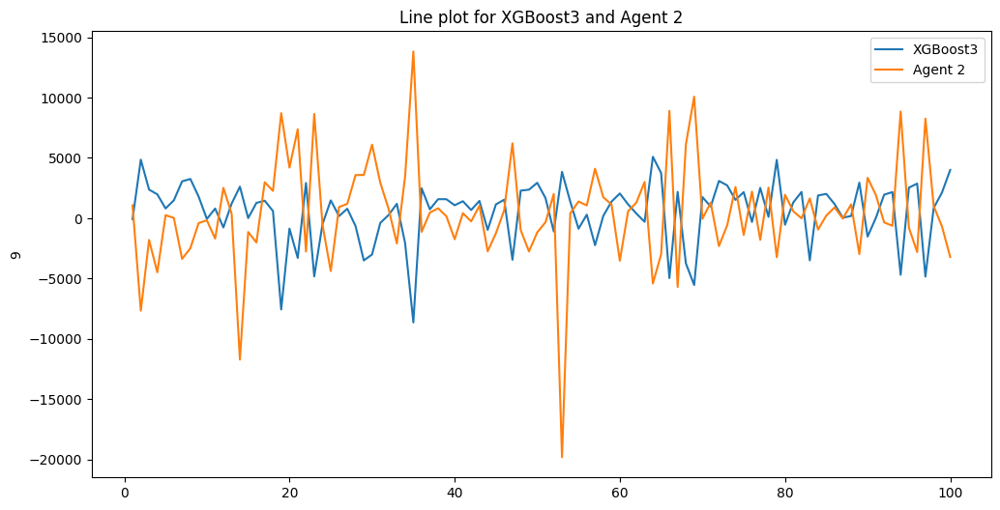

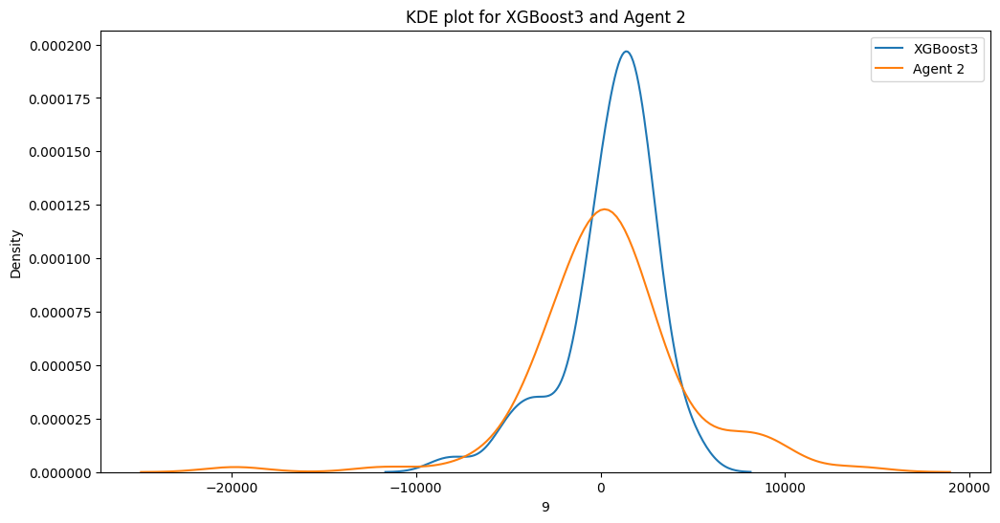

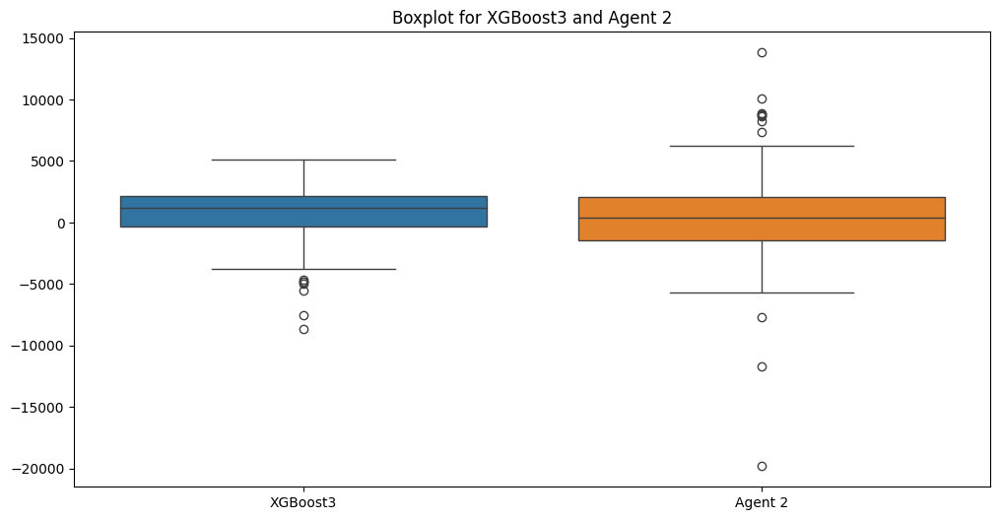

P_value_XGBoost3 2.982896249762993e-06
pvalue_other_agent  1.4999002068244965e-06
not normal
There isn't a statistically significant difference


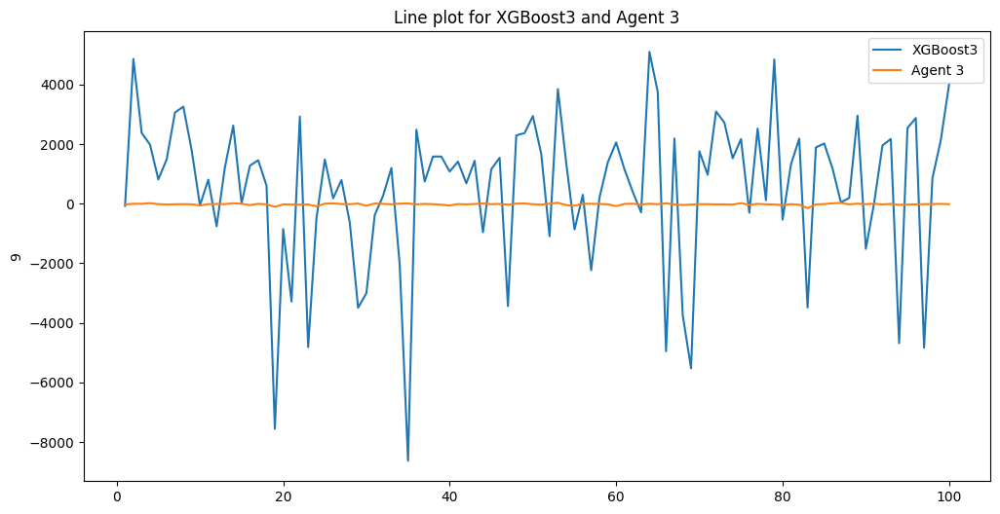

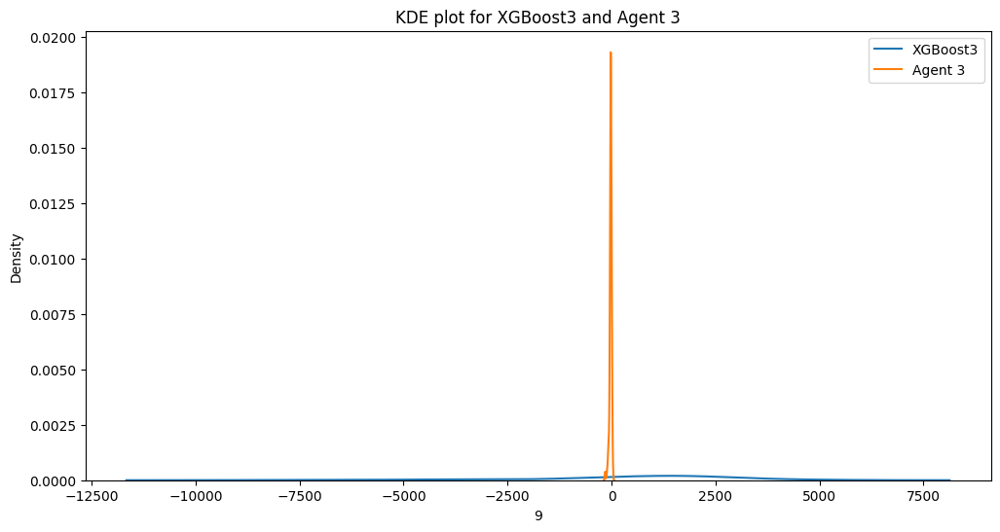

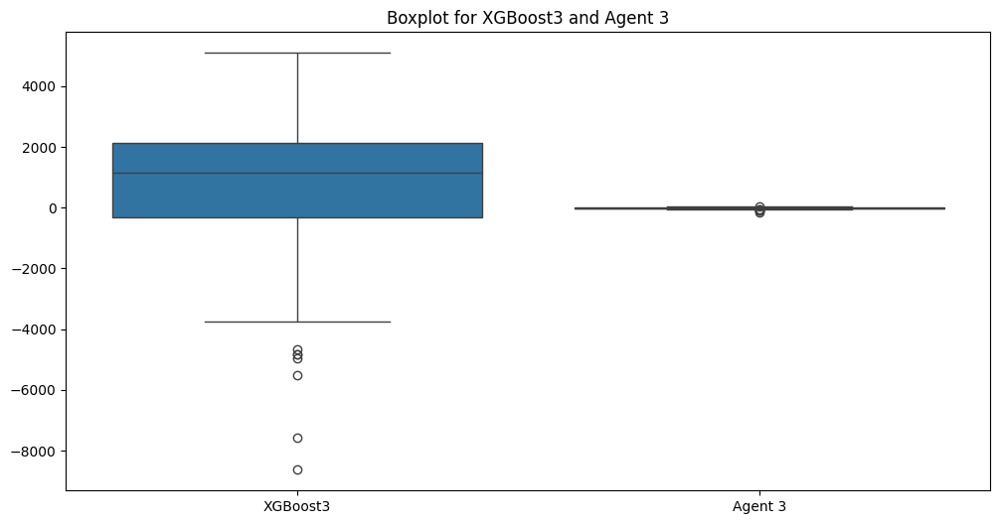

P_value_XGBoost3 2.982896249762993e-06
pvalue_other_agent  6.526796874925353e-08
not normal
There is a statistically significant difference
P-Value 2.6467900637960364e-07



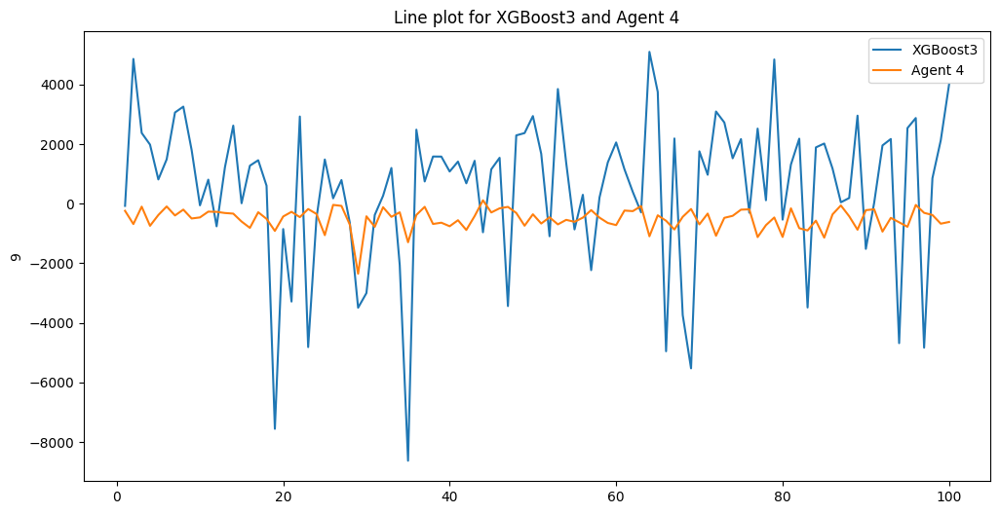

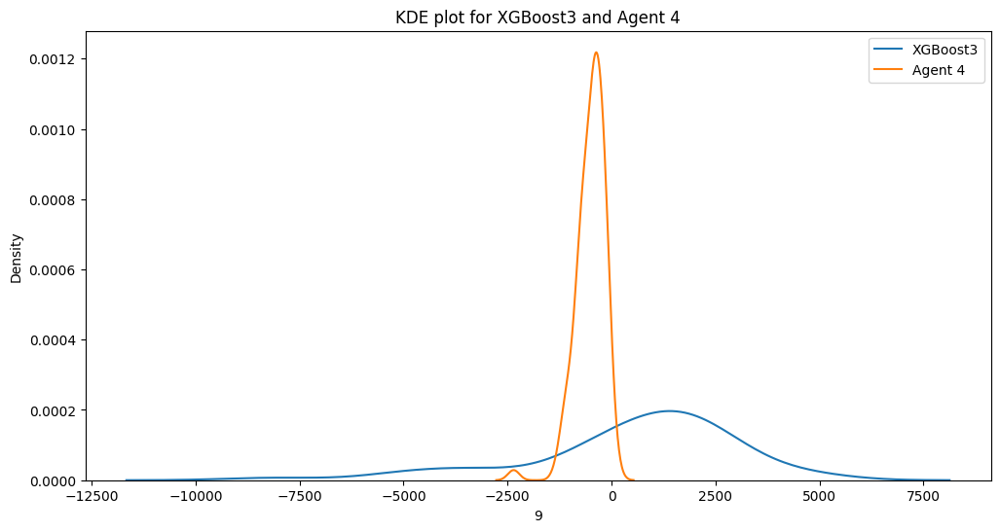

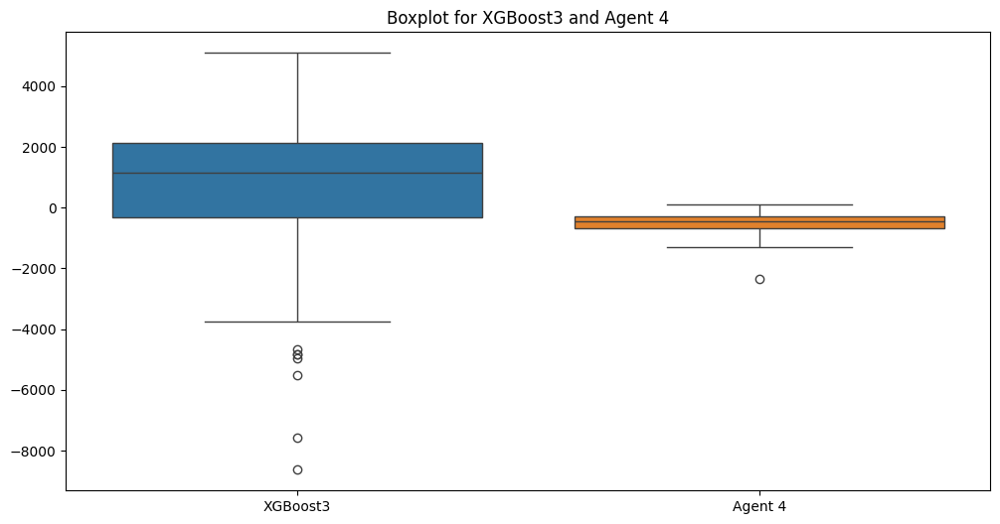

P_value_XGBoost3 2.982896249762993e-06
pvalue_other_agent  6.501998518989407e-07
not normal
There is a statistically significant difference
P-Value 7.022154995700607e-11



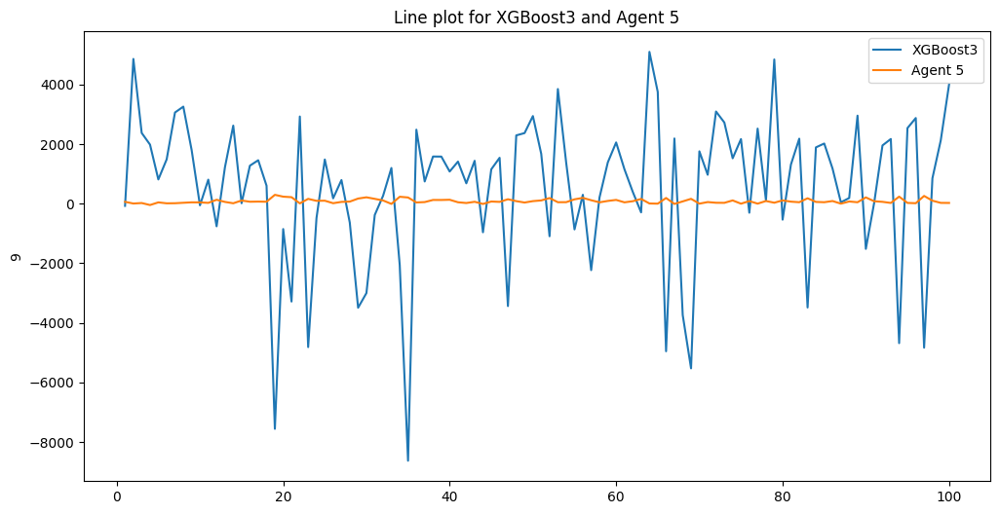

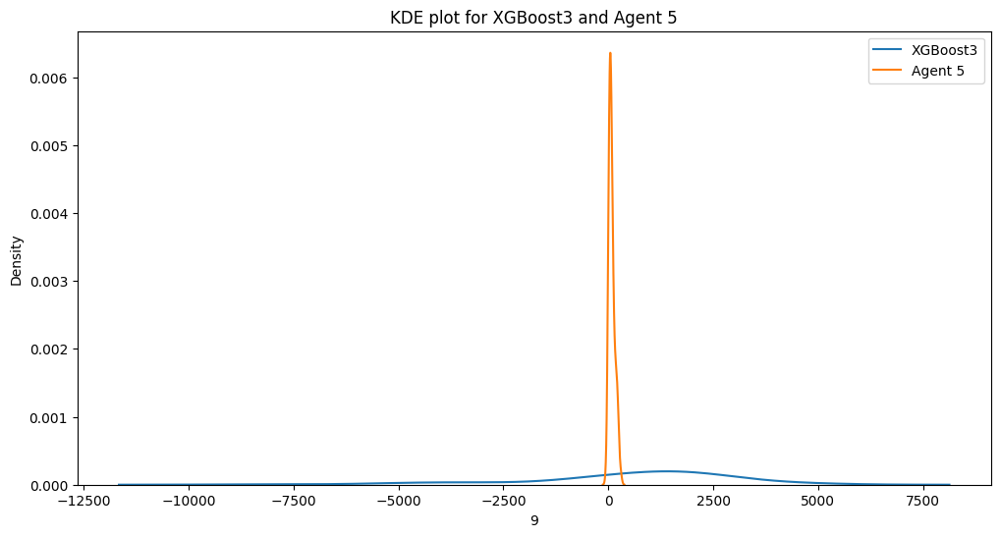

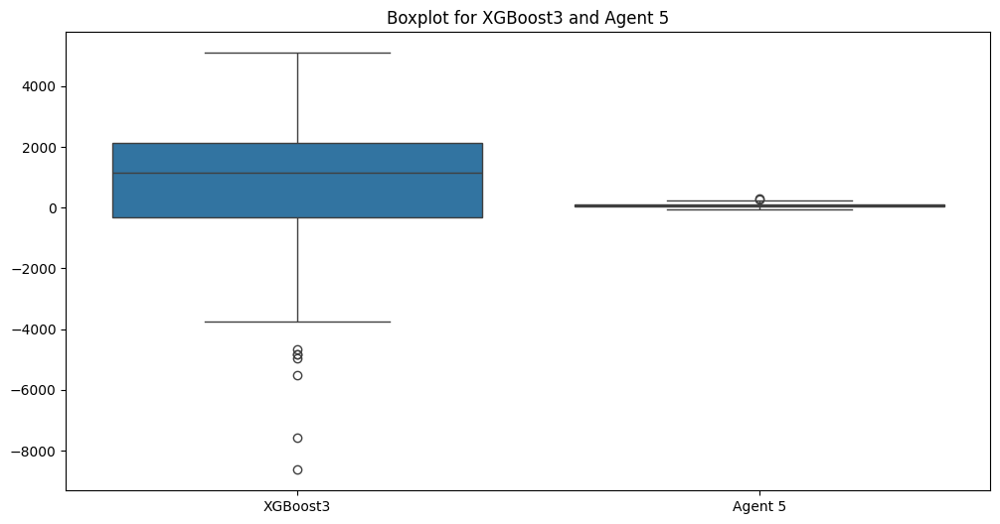

P_value_XGBoost3 2.982896249762993e-06
pvalue_other_agent  5.529689775616735e-05
not normal
There is a statistically significant difference
P-Value 9.270297293427863e-06



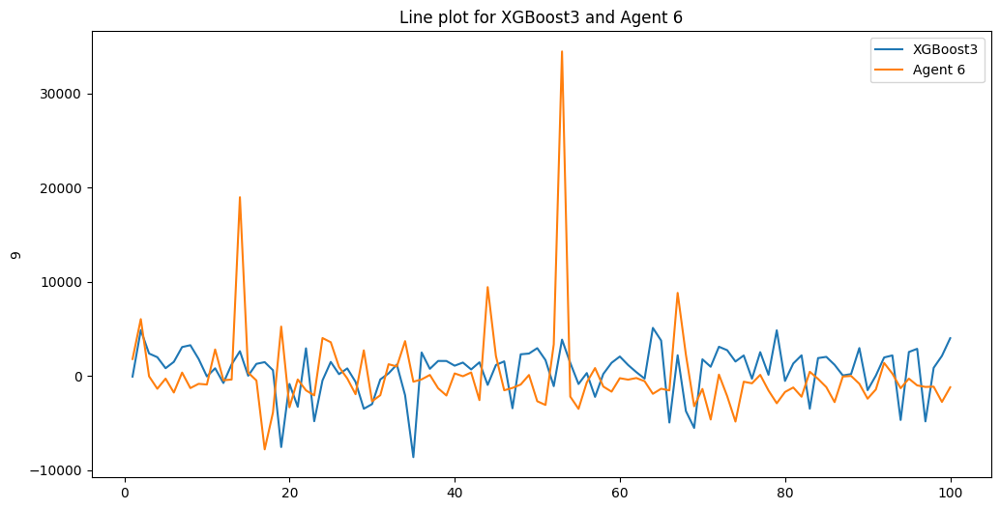

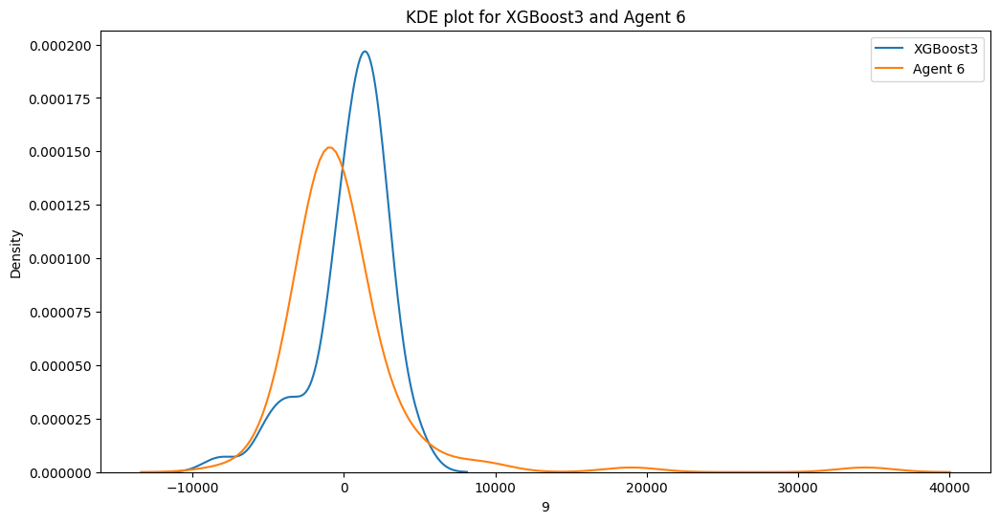

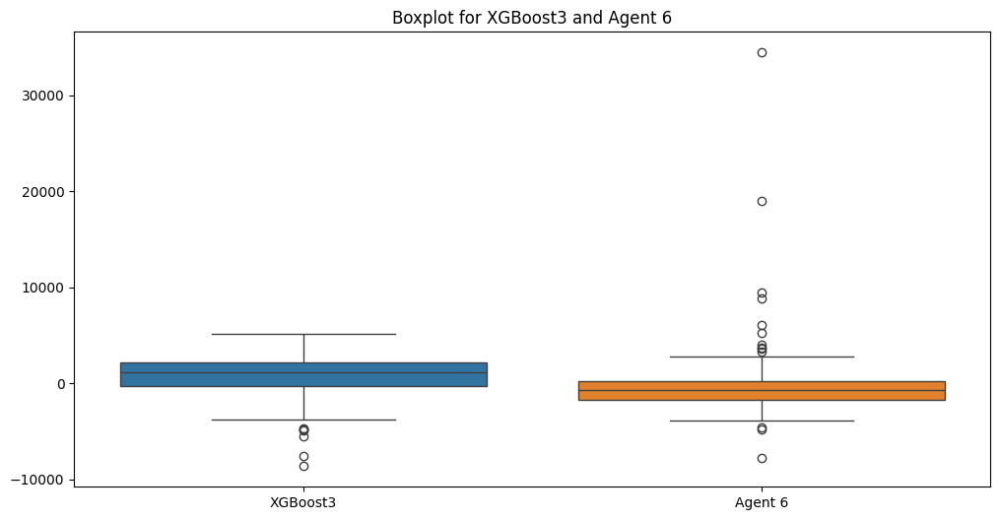

P_value_XGBoost3 2.982896249762993e-06
pvalue_other_agent  7.308943256340415e-16
not normal
There is a statistically significant difference
P-Value 9.59080662481525e-06



In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

xgboost1_avg_balance = averaged_df.iloc[:, -3]  # third last column
xgboost2_avg_balance = averaged_df.iloc[:, -2]  # second column
xgboost3_avg_balance = averaged_df.iloc[:, -1]  # Last column

# List to hold the two agents
agents = [
    ("XGBoost1", xgboost1_avg_balance),
    ("XGBoost2", xgboost2_avg_balance),
    ("XGBoost3", xgboost3_avg_balance),
]

# Loop through the two agents
for agent_name, agent in agents:
    # Loop through columns 1 to second last for other agents
    for col_index in range(averaged_df.shape[1] - 3):
        other_agent_balance = averaged_df.iloc[:, col_index]

        # Line plot for XGBoost and the other agent
        plt.figure(figsize=(12, 6))
        sns.lineplot(data=agent, label=agent_name)
        sns.lineplot(data=other_agent_balance, label="Agent " + str(col_index + 1))
        plt.title("Line plot for " + agent_name + " and Agent " + str(col_index + 1))
        plt.legend()
        plt.show()

        # KDE plot for the distributions
        plt.figure(figsize=(12, 6))
        sns.kdeplot(agent, label=agent_name)
        sns.kdeplot(other_agent_balance, label="Agent " + str(col_index + 1))
        plt.title("KDE plot for " + agent_name + " and Agent " + str(col_index + 1))
        plt.legend()
        plt.show()

        # Boxplot for the two distributions
        combined_data = pd.concat(
            [
                agent.rename(agent_name),
                other_agent_balance.rename("Agent " + str(col_index + 1)),
            ],
            axis=1,
        )
        plt.figure(figsize=(12, 6))
        sns.boxplot(data=combined_data)
        plt.title("Boxplot for " + agent_name + " and Agent " + str(col_index + 1))
        plt.show()

        # Check normality for both columns
        _, pvalue_xgboost = stats.shapiro(agent)
        _, pvalue_other_agent = stats.shapiro(other_agent_balance)
        print("P_value_" + agent_name, pvalue_xgboost)
        print("pvalue_other_agent ", pvalue_other_agent)

        # If both are normally distributed
        if pvalue_xgboost > 0.05 and pvalue_other_agent > 0.05:
            print("normal")
            statistic, pvalue = stats.ttest_ind(agent, other_agent_balance)
            if pvalue < 0.05:
                print("There is a statistically significant difference")
            else:
                print("There isn't a statistically significant difference")
        else:
            print("not normal")
            # If either or both are not normally distributed
            statistic, pvalue = stats.mannwhitneyu(agent, other_agent_balance)
            if pvalue < 0.05:
                print("There is a statistically significant difference")
                print("P-Value", pvalue)
                print("")
            else:
                print("There isn't a statistically significant difference")

In [11]:
averaged_df.shape

(100, 8)

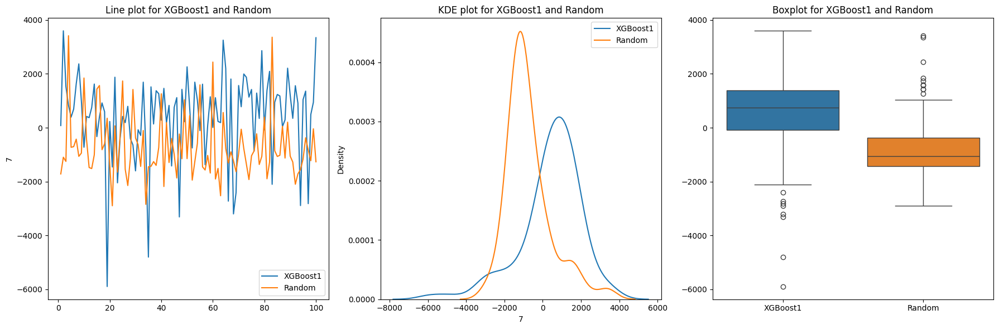

P_value_XGBoost1 5.016822841002034e-06
P_value_Random 3.3115925240036886e-07
not normal
There is a statistically significant difference
P-Value 2.241363978256441e-07



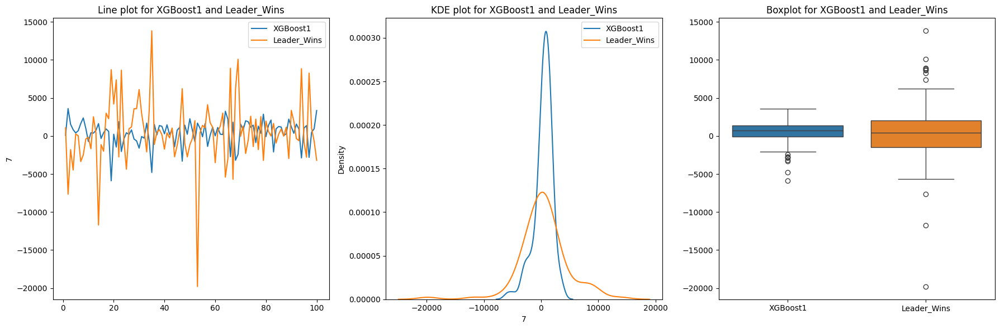

P_value_XGBoost1 5.016822841002034e-06
P_value_Leader_Wins 1.4999002068244965e-06
not normal
There isn't a statistically significant difference


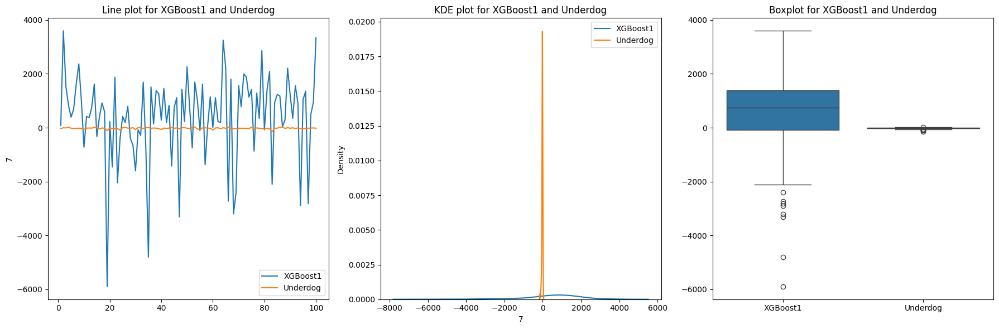

P_value_XGBoost1 5.016822841002034e-06
P_value_Underdog 6.526796874925353e-08
not normal
There is a statistically significant difference
P-Value 0.00014710248957640129



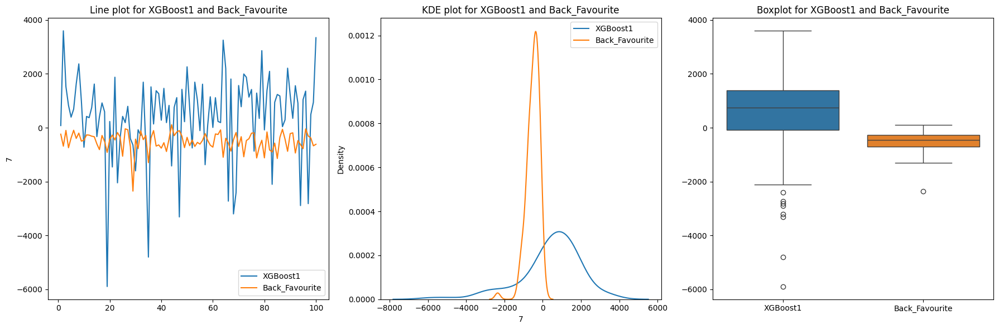

P_value_XGBoost1 5.016822841002034e-06
P_value_Back_Favourite 6.501998518989407e-07
not normal
There is a statistically significant difference
P-Value 2.160219772158601e-07



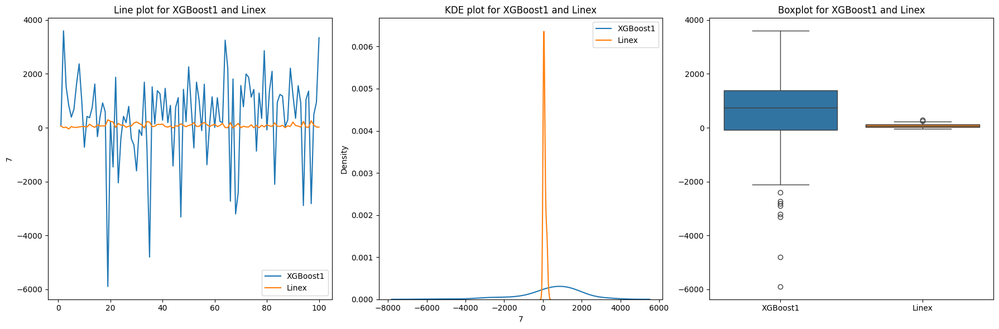

P_value_XGBoost1 5.016822841002034e-06
P_value_Linex 5.529689775616735e-05
not normal
There is a statistically significant difference
P-Value 0.0012144533585449683



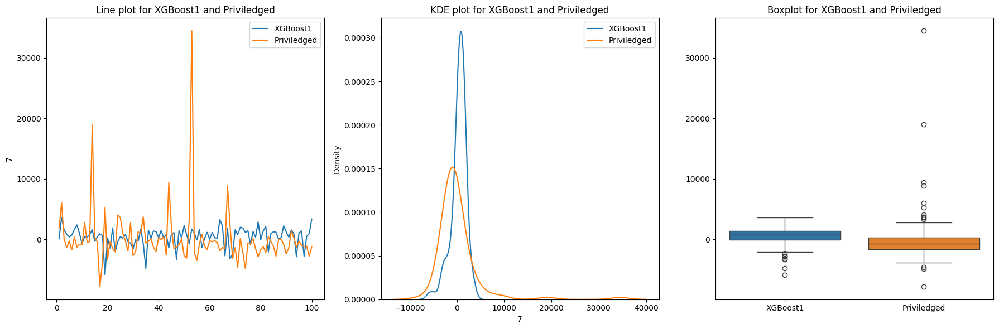

P_value_XGBoost1 5.016822841002034e-06
P_value_Priviledged 7.308943256340415e-16
not normal
There is a statistically significant difference
P-Value 0.0015973939300420173



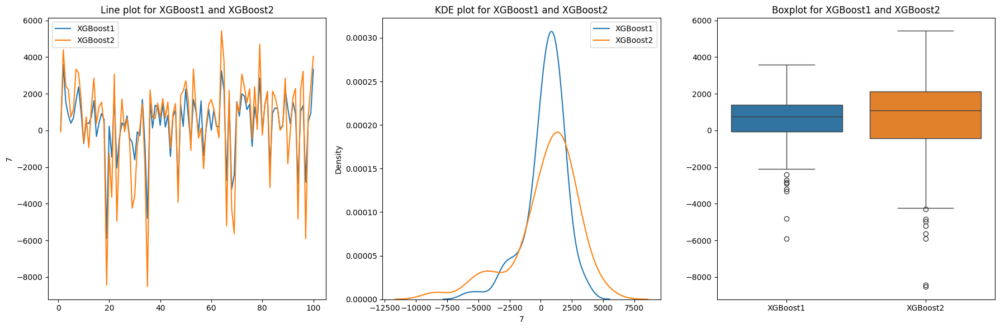

P_value_XGBoost1 5.016822841002034e-06
P_value_XGBoost2 1.3294134009349506e-06
not normal
There isn't a statistically significant difference


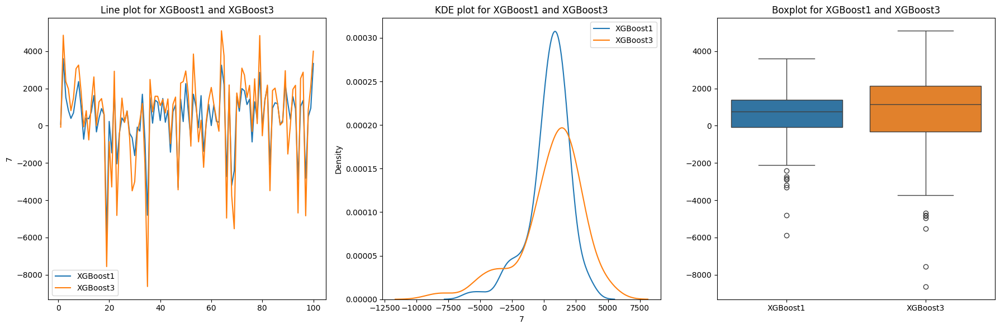

P_value_XGBoost1 5.016822841002034e-06
P_value_XGBoost3 2.982896249762993e-06
not normal
There is a statistically significant difference
P-Value 0.01974364659467001



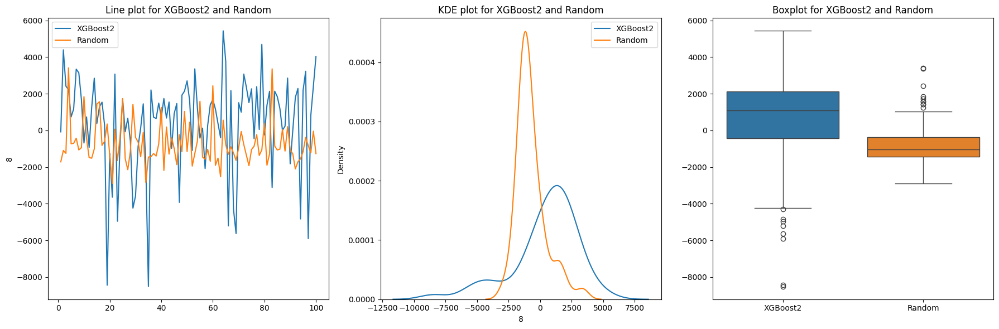

P_value_XGBoost2 1.3294134009349506e-06
P_value_Random 3.3115925240036886e-07
not normal
There is a statistically significant difference
P-Value 1.2033085813778238e-05



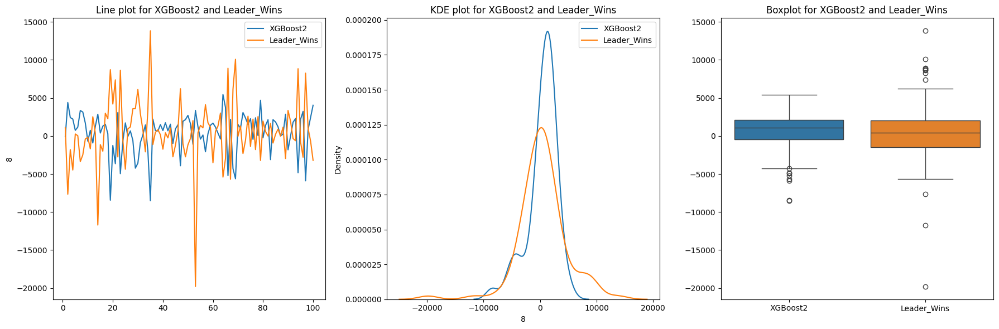

P_value_XGBoost2 1.3294134009349506e-06
P_value_Leader_Wins 1.4999002068244965e-06
not normal
There isn't a statistically significant difference


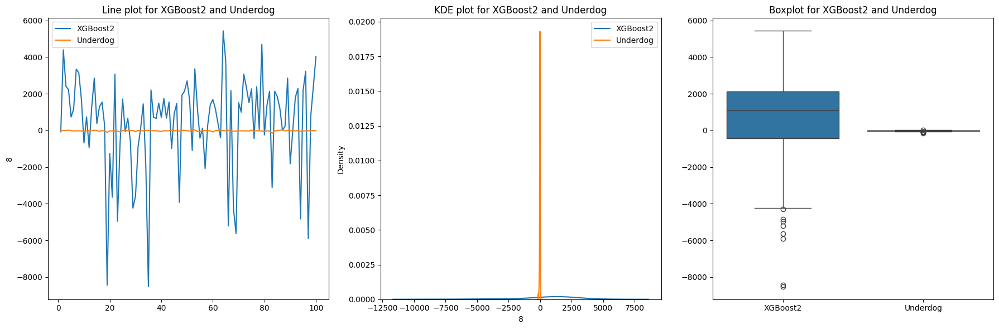

P_value_XGBoost2 1.3294134009349506e-06
P_value_Underdog 6.526796874925353e-08
not normal
There is a statistically significant difference
P-Value 0.0021872952496648154



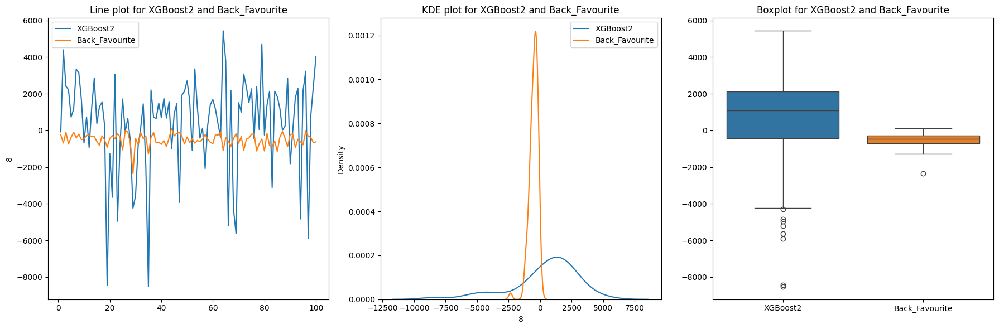

P_value_XGBoost2 1.3294134009349506e-06
P_value_Back_Favourite 6.501998518989407e-07
not normal
There is a statistically significant difference
P-Value 5.03955383934918e-05



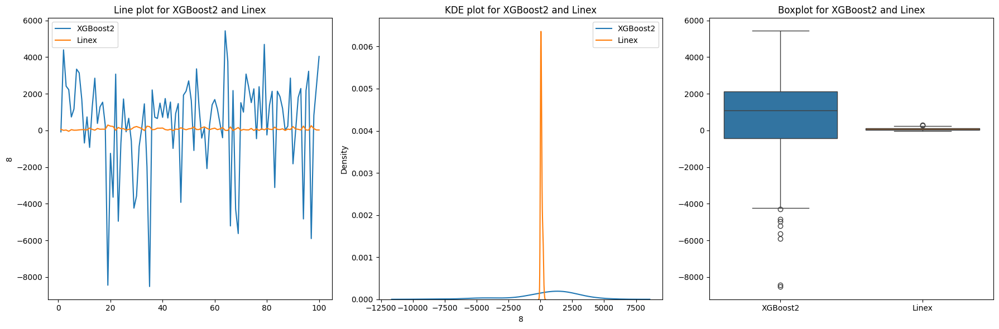

P_value_XGBoost2 1.3294134009349506e-06
P_value_Linex 5.529689775616735e-05
not normal
There is a statistically significant difference
P-Value 0.00588541063642929



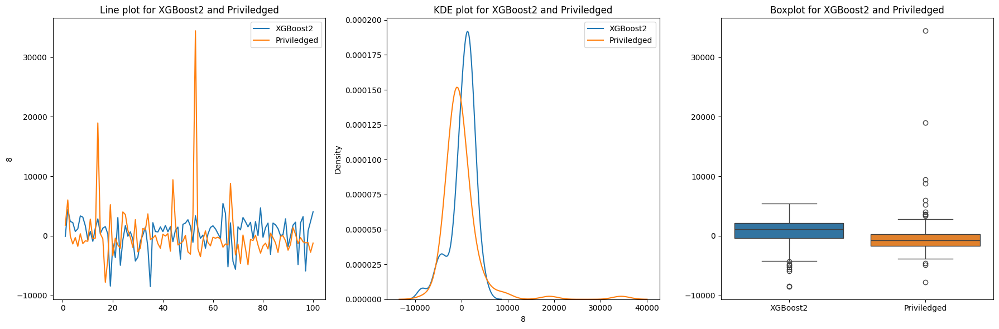

P_value_XGBoost2 1.3294134009349506e-06
P_value_Priviledged 7.308943256340415e-16
not normal
There is a statistically significant difference
P-Value 0.009720395042349915



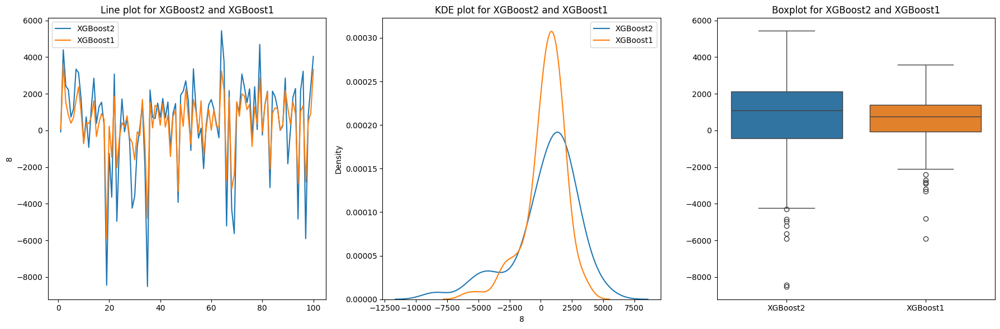

P_value_XGBoost2 1.3294134009349506e-06
P_value_XGBoost1 5.016822841002034e-06
not normal
There isn't a statistically significant difference


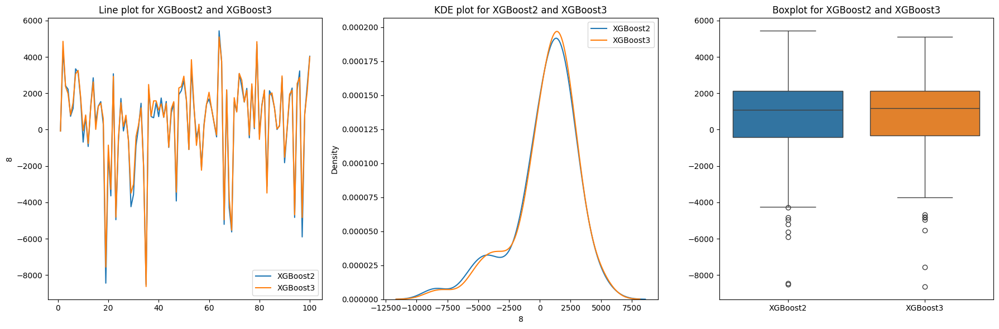

P_value_XGBoost2 1.3294134009349506e-06
P_value_XGBoost3 2.982896249762993e-06
not normal
There is a statistically significant difference
P-Value 0.0012144533585449683



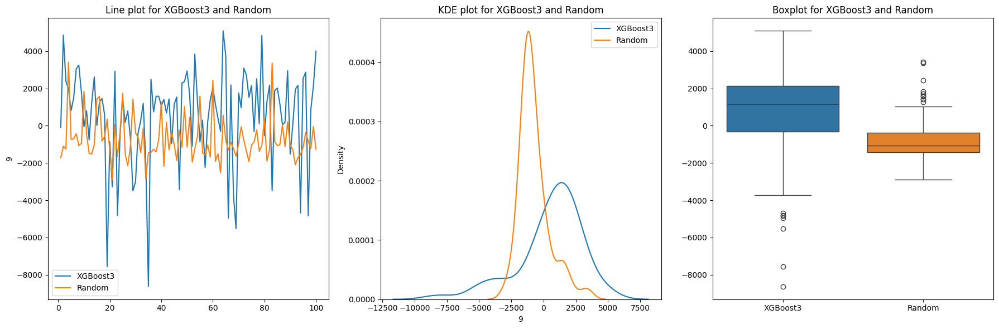

P_value_XGBoost3 2.982896249762993e-06
P_value_Random 3.3115925240036886e-07
not normal
There is a statistically significant difference
P-Value 3.512862758501503e-06



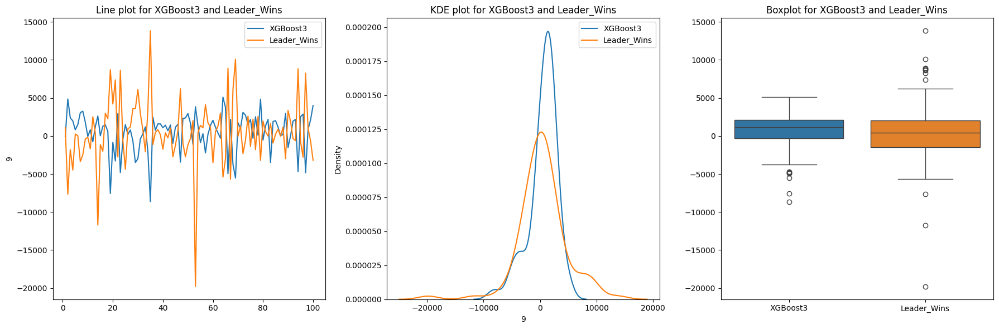

P_value_XGBoost3 2.982896249762993e-06
P_value_Leader_Wins 1.4999002068244965e-06
not normal
There isn't a statistically significant difference


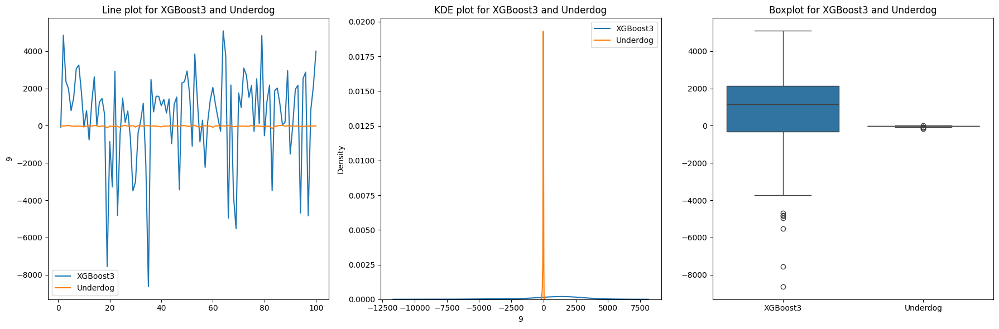

P_value_XGBoost3 2.982896249762993e-06
P_value_Underdog 6.526796874925353e-08
not normal
There is a statistically significant difference
P-Value 0.0009066984880501063



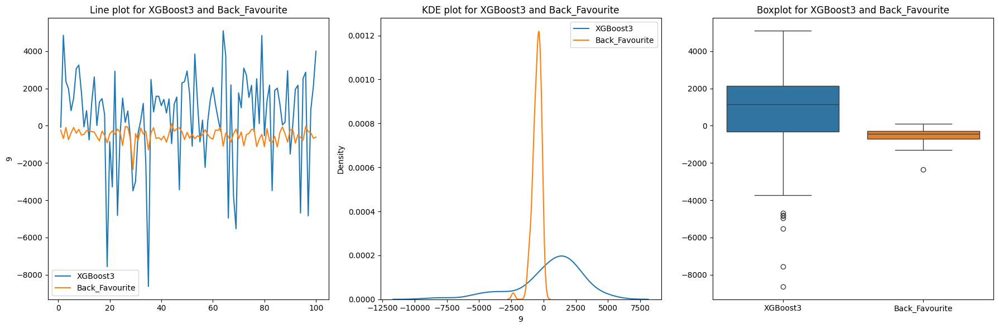

P_value_XGBoost3 2.982896249762993e-06
P_value_Back_Favourite 6.501998518989407e-07
not normal
There is a statistically significant difference
P-Value 1.2815360586603802e-05



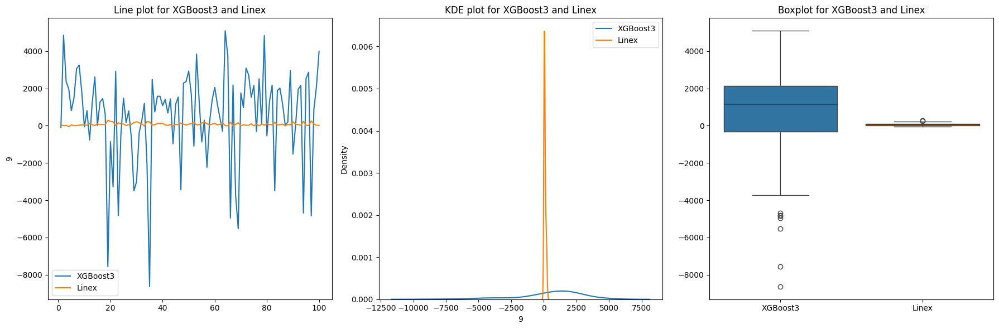

P_value_XGBoost3 2.982896249762993e-06
P_value_Linex 5.529689775616735e-05
not normal
There is a statistically significant difference
P-Value 0.0025087212297265674



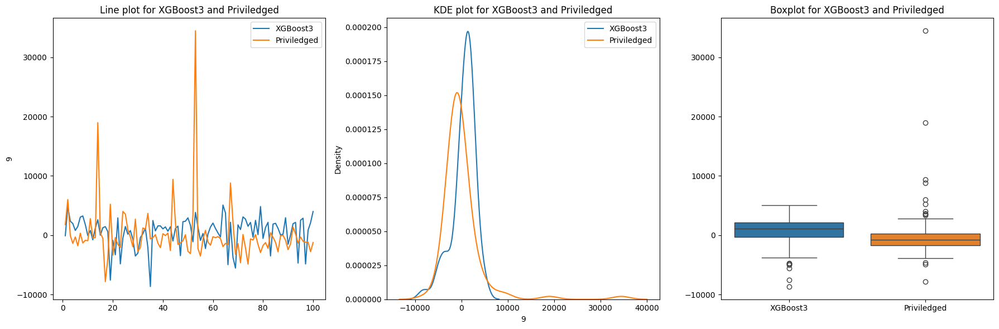

P_value_XGBoost3 2.982896249762993e-06
P_value_Priviledged 7.308943256340415e-16
not normal
There is a statistically significant difference
P-Value 0.005074993073250638



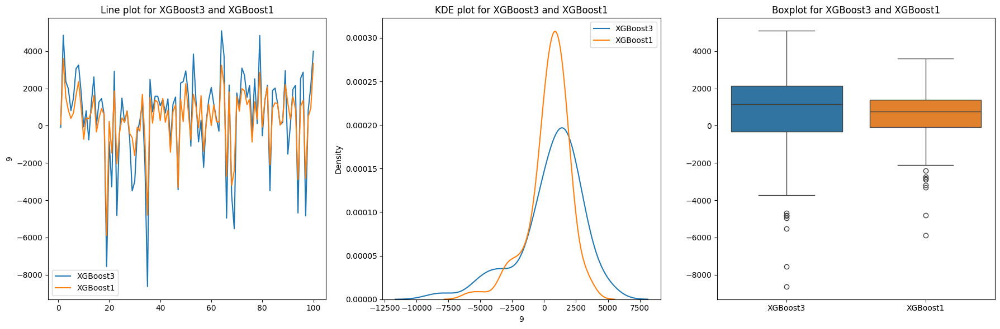

P_value_XGBoost3 2.982896249762993e-06
P_value_XGBoost1 5.016822841002034e-06
not normal
There is a statistically significant difference
P-Value 0.01974364659467001



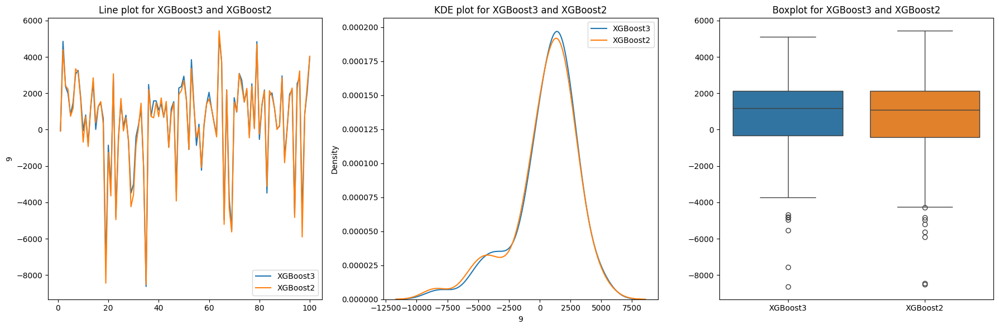

P_value_XGBoost3 2.982896249762993e-06
P_value_XGBoost2 1.3294134009349506e-06
not normal
There is a statistically significant difference
P-Value 0.0012144533585449683



In [5]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# Define agent names for easier access and readability
agent_names = [
    "Random",
    "Leader_Wins",
    "Underdog",
    "Back_Favourite",
    "Linex",
    "Priviledged",
    "XGBoost1",
    "XGBoost2",
    "XGBoost3",
]

# Define the indices of 'XGBoost1_NoBal' and 'XGBoost1_2000NoBal' in the agent_names list
xgboost_indices = [6, 7, 8]

# Loop through 'XGBoost1_NoBal' and 'XGBoost1_2000NoBal'
for col_index in xgboost_indices:
    agent_balance = averaged_df.iloc[:, col_index]
    agent_name = agent_names[col_index]

    # Loop through all other agents
    for other_col_index in range(averaged_df.shape[1]):
        other_agent_name = agent_names[other_col_index]

        # Skip if the agent is the same
        if agent_name == other_agent_name:
            continue

        other_agent_balance = averaged_df.iloc[:, other_col_index]

        # Group the plots horizontally
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        # Line plot for the agent and the other agent
        sns.lineplot(data=agent_balance, ax=axes[0], label=agent_name)
        sns.lineplot(data=other_agent_balance, ax=axes[0], label=other_agent_name)
        axes[0].set_title(f"Line plot for {agent_name} and {other_agent_name}")
        axes[0].legend()

        # KDE plot for the distributions
        sns.kdeplot(agent_balance, ax=axes[1], label=agent_name)
        sns.kdeplot(other_agent_balance, ax=axes[1], label=other_agent_name)
        axes[1].set_title(f"KDE plot for {agent_name} and {other_agent_name}")
        axes[1].legend()

        # Boxplot for the two distributions
        combined_data = pd.concat(
            [
                agent_balance.rename(agent_name),
                other_agent_balance.rename(other_agent_name),
            ],
            axis=1,
        )
        sns.boxplot(data=combined_data, ax=axes[2])
        axes[2].set_title(f"Boxplot for {agent_name} and {other_agent_name}")

        plt.tight_layout()
        plt.show()

        # Check normality for both columns
        _, pvalue_agent = stats.shapiro(agent_balance)
        _, pvalue_other_agent = stats.shapiro(other_agent_balance)
        print(f"P_value_{agent_name}", pvalue_agent)
        print(f"P_value_{other_agent_name}", pvalue_other_agent)

        # If both are normally distributed
        if pvalue_agent > 0.05 and pvalue_other_agent > 0.05:
            print("normal")
            statistic, pvalue = stats.ttest_rel(agent_balance, other_agent_balance)
            if pvalue < 0.05:
                print("There is a statistically significant difference")
            else:
                print("There isn't a statistically significant difference")
        else:
            print("not normal")
            # If either or both are not normally distributed
            statistic, pvalue = stats.wilcoxon(agent_balance, other_agent_balance)
            if pvalue < 0.05:
                print("There is a statistically significant difference")
                print("P-Value", pvalue)
                print("")
            else:
                print("There isn't a statistically significant difference")

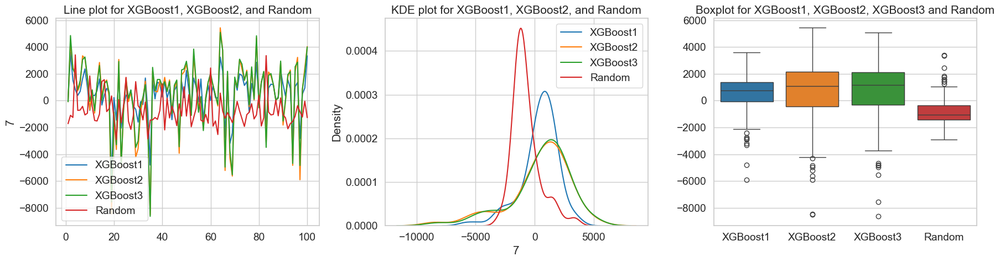

P_value_XGBoost1 5.016822841002034e-06
P_value_XGBoost2 1.3294134009349506e-06
P_value_XGBoost3 2.982896249762993e-06
P_value_Random 3.3115925240036886e-07
not normal
There is a statistically significant difference
P-Value 4.236028983740497e-10



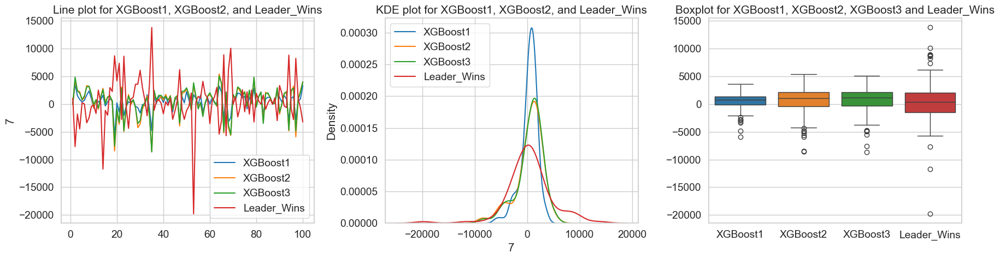

P_value_XGBoost1 5.016822841002034e-06
P_value_XGBoost2 1.3294134009349506e-06
P_value_XGBoost3 2.982896249762993e-06
P_value_Leader_Wins 1.4999002068244965e-06
not normal
There is a statistically significant difference
P-Value 0.00228923493297881



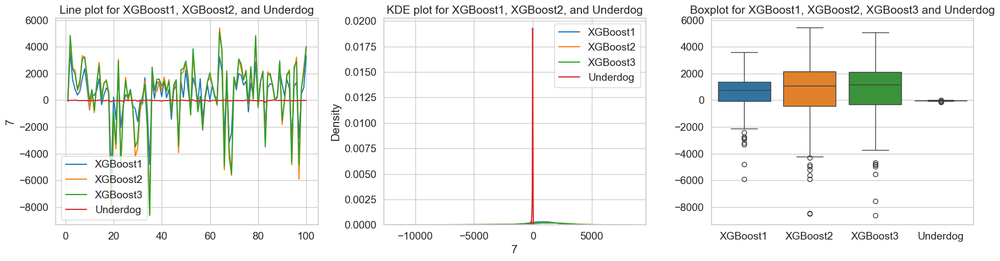

P_value_XGBoost1 5.016822841002034e-06
P_value_XGBoost2 1.3294134009349506e-06
P_value_XGBoost3 2.982896249762993e-06
P_value_Underdog 6.526796874925353e-08
not normal
There is a statistically significant difference
P-Value 6.118982004024596e-09



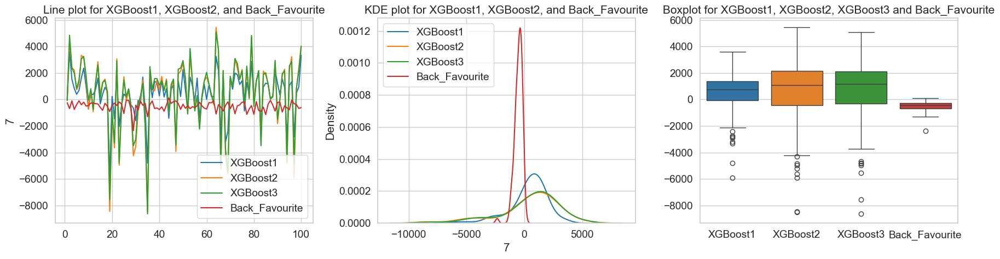

P_value_XGBoost1 5.016822841002034e-06
P_value_XGBoost2 1.3294134009349506e-06
P_value_XGBoost3 2.982896249762993e-06
P_value_Back_Favourite 6.501998518989407e-07
not normal
There is a statistically significant difference
P-Value 1.0117512374419894e-12



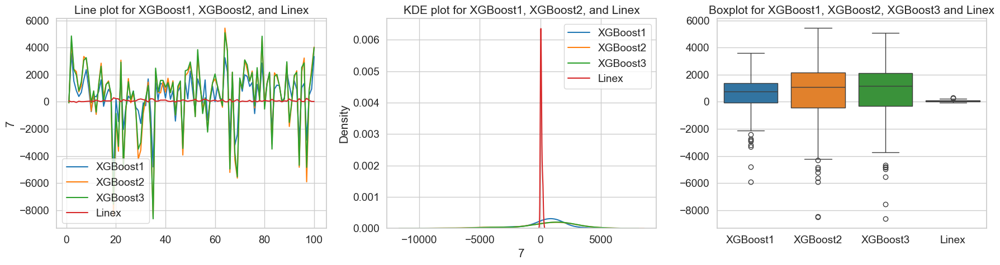

P_value_XGBoost1 5.016822841002034e-06
P_value_XGBoost2 1.3294134009349506e-06
P_value_XGBoost3 2.982896249762993e-06
P_value_Linex 5.529689775616735e-05
not normal
There is a statistically significant difference
P-Value 1.2889693926776923e-07



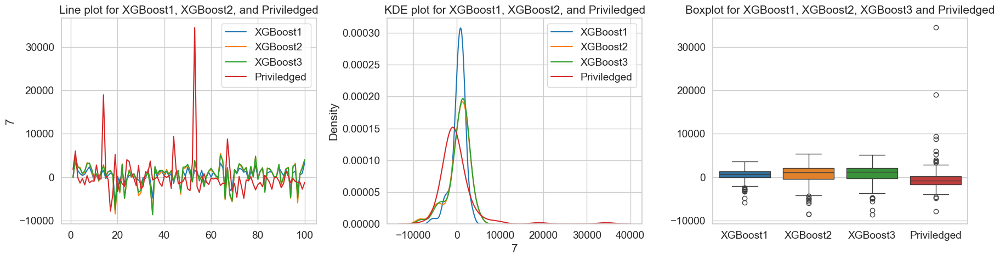

P_value_XGBoost1 5.016822841002034e-06
P_value_XGBoost2 1.3294134009349506e-06
P_value_XGBoost3 2.982896249762993e-06
P_value_Priviledged 7.308943256340415e-16
not normal
There is a statistically significant difference
P-Value 1.1188031327090382e-08



In [13]:
from scipy.stats import friedmanchisquare
from scipy.stats import wilcoxon
from statsmodels.stats.anova import AnovaRM

xgboost2_avg_balance = averaged_df.iloc[:, 7]  # XGBoost2 column
xgboost1_avg_balance = averaged_df.iloc[:, 6]  # XGBoost1 column
xgboost3_avg_balance = averaged_df.iloc[:, 8]  # XGBoost3 column

# Define agent names for easier access and readability
agent_names = [
    "Random",
    "Leader_Wins",
    "Underdog",
    "Back_Favourite",
    "Linex",
    "Priviledged",
]

# Setting style and text scale for seaborn plots
sns.set_style("whitegrid")
sns.set_context(
    "notebook", font_scale=1.25
)  # Adjust the font_scale to increase text size

# Loop through columns 0-5 for other agents
for col_index in range(6):
    other_agent_balance = averaged_df.iloc[:, col_index]
    agent_name = agent_names[col_index]

    # Group the plots horizontally with modified height
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # Decreased the height from 6 to 5

    # Line plot for XGBoost1, XGBoost2, and the other agent
    sns.lineplot(data=xgboost1_avg_balance, ax=axes[0], label="XGBoost1")
    sns.lineplot(data=xgboost2_avg_balance, ax=axes[0], label="XGBoost2")
    sns.lineplot(data=xgboost3_avg_balance, ax=axes[0], label="XGBoost3")
    sns.lineplot(data=other_agent_balance, ax=axes[0], label=agent_name)
    axes[0].set_title(f"Line plot for XGBoost1, XGBoost2, and {agent_name}")
    axes[0].legend()

    # KDE plot for the distributions
    sns.kdeplot(xgboost1_avg_balance, ax=axes[1], label="XGBoost1")
    sns.kdeplot(xgboost2_avg_balance, ax=axes[1], label="XGBoost2")
    sns.kdeplot(xgboost3_avg_balance, ax=axes[1], label="XGBoost3")
    sns.kdeplot(other_agent_balance, ax=axes[1], label=agent_name)
    axes[1].set_title(f"KDE plot for XGBoost1, XGBoost2, and {agent_name}")
    axes[1].legend()

    # Boxplot for the three distributions
    combined_data = pd.concat(
        [
            xgboost1_avg_balance.rename("XGBoost1"),
            xgboost2_avg_balance.rename("XGBoost2"),
            xgboost3_avg_balance.rename("XGBoost3"),
            other_agent_balance.rename(agent_name),
        ],
        axis=1,
    )
    sns.boxplot(data=combined_data, ax=axes[2])
    axes[2].set_title(f"Boxplot for XGBoost1, XGBoost2, XGBoost3 and {agent_name}")

    plt.tight_layout()
    plt.show()

    # Check normality for all three columns
    _, pvalue_xgboost1 = stats.shapiro(xgboost1_avg_balance)
    _, pvalue_xgboost2 = stats.shapiro(xgboost2_avg_balance)
    _, pvalue_xgboost3 = stats.shapiro(xgboost3_avg_balance)
    _, pvalue_other_agent = stats.shapiro(other_agent_balance)
    print(f"P_value_XGBoost1", pvalue_xgboost1)
    print(f"P_value_XGBoost2", pvalue_xgboost2)
    print(f"P_value_XGBoost3", pvalue_xgboost3)
    print(f"P_value_{agent_name}", pvalue_other_agent)

    # If all are normally distributed
    if (
        pvalue_xgboost1 > 0.05
        and pvalue_xgboost2 > 0.05
        and pvalue_xgboost3 > 0.05
        and pvalue_other_agent > 0.05
    ):
        print("normal")
        # Prepare data for repeated measures ANOVA
        data = pd.concat(
            [
                xgboost1_avg_balance,
                xgboost2_avg_balance,
                xgboost3_avg_balance,
                other_agent_balance,
            ],
            axis=1,
        )
        data = data.melt(var_name="group", value_name="value")
        data["id"] = data.index
        # Perform repeated measures ANOVA
        model = AnovaRM(data, "value", "id", within=["group"])
        res = model.fit()
        print(res)
    else:
        print("not normal")
        # If either or both are not normally distributed
        statistic, pvalue = friedmanchisquare(
            xgboost1_avg_balance,
            xgboost2_avg_balance,
            xgboost3_avg_balance,
            other_agent_balance,
        )
        if pvalue < 0.05:
            print("There is a statistically significant difference")
            print("P-Value", pvalue)
            print("")
        else:
            print("There isn't a statistically significant difference")

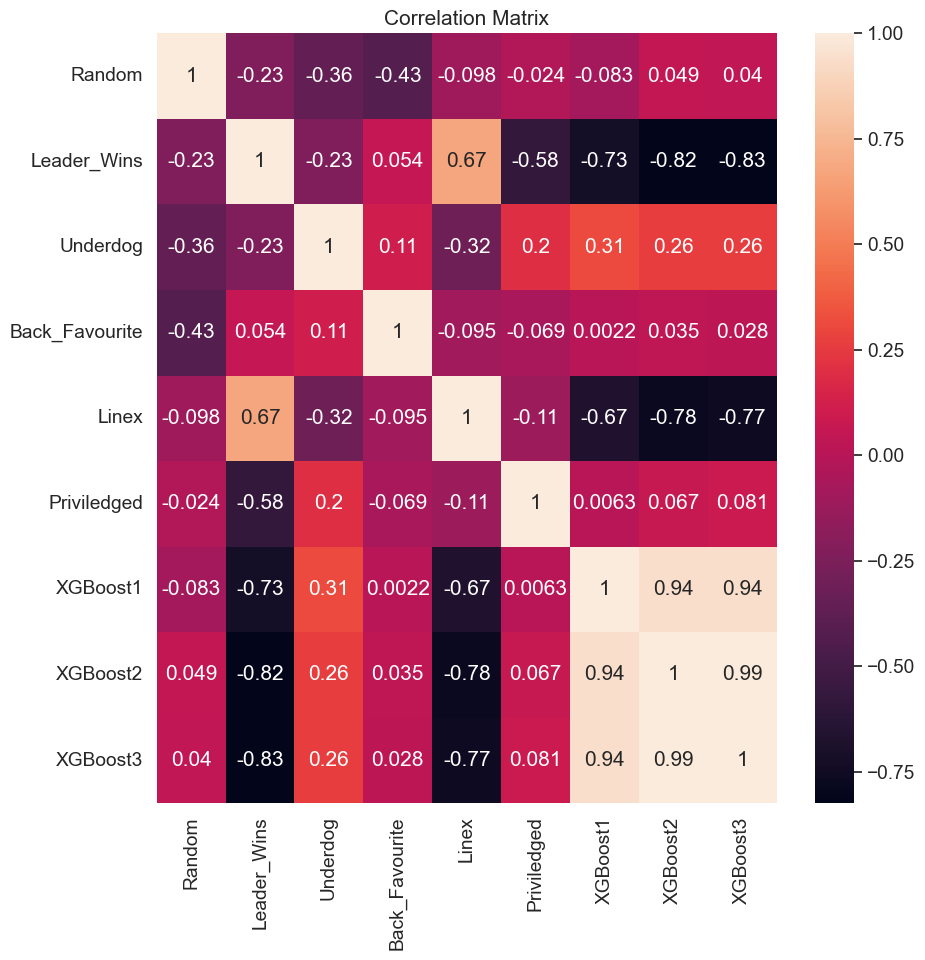

1   -731.574943
2    468.751368
3    -20.884978
4   -506.562133
5     81.869391
6     57.549267
7    407.103237
8    425.773077
9    526.377008
dtype: float64


In [8]:
agent_names = [
    "Random",
    "Leader_Wins",
    "Underdog",
    "Back_Favourite",
    "Linex",
    "Priviledged",
    "XGBoost1",
    "XGBoost2",
    "XGBoost3",
]

# Create a new figure with a specified size (width, height)
plt.figure(figsize=(10, 10))

# Compute correlation matrix
correlation_matrix = averaged_df.corr()

# Set index and columns to agent names
correlation_matrix.index = agent_names
correlation_matrix.columns = agent_names

# Plot heatmap
sns.heatmap(
    correlation_matrix,
    annot=True,
)  # cmap="coolwarm_r"

# Set title
plt.title("Correlation Matrix")

# Show the plot
plt.show()

mean_balances = averaged_df.mean()
print(mean_balances)

Pairwise correlation matrix: This can help you understand the relationship between different agents. If two agents have a high positive correlation, it means they tend to have high balances at the same time. If they have a high negative correlation, it means when one has a high balance, the other tends to have a low balance.

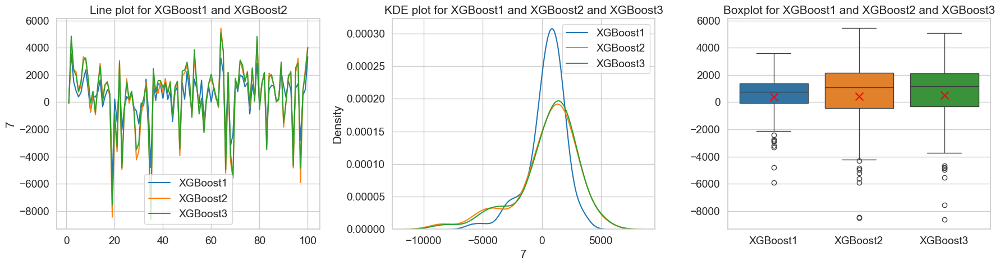

P_value_XGBoost1 5.016822841002034e-06
P_value_XGBoost2 1.3294134009349506e-06
P_value_XGBoost3 2.982896249762993e-06
not normal
There is a statistically significant difference
P-Value 0.0006621622112122437

XGBoost1    407.103237
XGBoost2    425.773077
XGBoost3    526.377008
dtype: float64


In [26]:
import scikit_posthocs as sp


xgboost2_avg_balance = averaged_df.iloc[:, 7]  # XGBoost2 column
xgboost1_avg_balance = averaged_df.iloc[:, 6]  # XGBoost1 column
xgboost3_avg_balance = averaged_df.iloc[:, 8]  # XGBoost3 column

# Setting style and text scale for seaborn plots
sns.set_style("whitegrid")
sns.set_context(
    "notebook", font_scale=1.25
)  # Adjust the font_scale to increase text size

# Group the plots horizontally with modified height
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # Decreased the height from 6 to 5

# Line plot for XGBoost1 and XGBoost2
sns.lineplot(data=xgboost1_avg_balance, ax=axes[0], label="XGBoost1")
sns.lineplot(data=xgboost2_avg_balance, ax=axes[0], label="XGBoost2")
sns.lineplot(data=xgboost3_avg_balance, ax=axes[0], label="XGBoost3")
axes[0].set_title("Line plot for XGBoost1 and XGBoost2")
axes[0].legend()

# KDE plot for the distributions
sns.kdeplot(xgboost1_avg_balance, ax=axes[1], label="XGBoost1")
sns.kdeplot(xgboost2_avg_balance, ax=axes[1], label="XGBoost2")
sns.kdeplot(xgboost3_avg_balance, ax=axes[1], label="XGBoost3")
axes[1].set_title("KDE plot for XGBoost1 and XGBoost2 and XGBoost3")
axes[1].legend()

# # Boxplot for the two distributions
# combined_data = pd.concat(
#     [xgboost1_avg_balance.rename("XGBoost1"), xgboost2_avg_balance.rename("XGBoost2")],
#     axis=1,
# )
# sns.boxplot(data=combined_data, ax=axes[2])
# axes[2].set_title("Boxplot for XGBoost1 and XGBoost2")

# Boxplot for the two distributions
combined_data = pd.concat(
    [xgboost1_avg_balance.rename("XGBoost1"), xgboost2_avg_balance.rename("XGBoost2"), xgboost3_avg_balance.rename("XGBoost3")],
    axis=1,
)
sns.boxplot(data=combined_data, ax=axes[2])

# Calculate the means
means = combined_data.mean()

# Add a black 'x' for the mean of each distribution
for i, mean in enumerate(means):
    axes[2].scatter(
        i, mean, marker="x", color="red", s=100, zorder=3
    )  # s parameter is for size of 'x', zorder=3 ensures the marker is drawn on top

axes[2].set_title("Boxplot for XGBoost1 and XGBoost2 and XGBoost3")

plt.tight_layout()
plt.show()

# Check normality for all three columns
_, pvalue_xgboost1 = stats.shapiro(xgboost1_avg_balance)
_, pvalue_xgboost2 = stats.shapiro(xgboost2_avg_balance)
_, pvalue_xgboost3 = stats.shapiro(xgboost3_avg_balance)
print("P_value_XGBoost1", pvalue_xgboost1)
print("P_value_XGBoost2", pvalue_xgboost2)
print("P_value_XGBoost3", pvalue_xgboost3)

# If all are normally distributed
if pvalue_xgboost1 > 0.05 and pvalue_xgboost2 > 0.05 and pvalue_xgboost3 > 0.05:
    print("normal")
    # Prepare data for repeated measures ANOVA
    data = pd.concat(
        [xgboost1_avg_balance, xgboost2_avg_balance, xgboost3_avg_balance], axis=1
    )
    data = data.melt(var_name="group", value_name="value")
    data["id"] = data.index
    # Perform repeated measures ANOVA
    model = AnovaRM(data, "value", "id", within=["group"])
    res = model.fit()
    print(res)
else:
    print("not normal")
    # If either or all are not normally distributed
    statistic, pvalue = friedmanchisquare(
        xgboost1_avg_balance, xgboost2_avg_balance, xgboost3_avg_balance
    )
    if pvalue < 0.05:
        print("There is a statistically significant difference")
        print("P-Value", pvalue)
        print("")
    else:
        print("There isn't a statistically significant difference")

print(means)

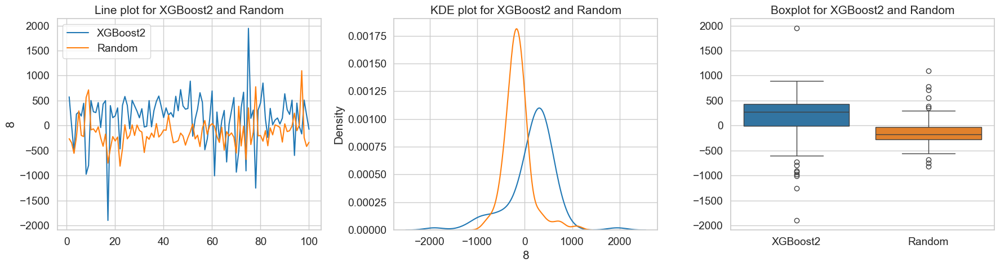

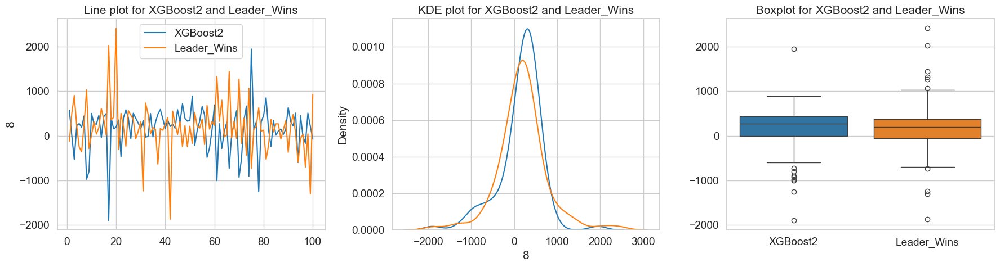

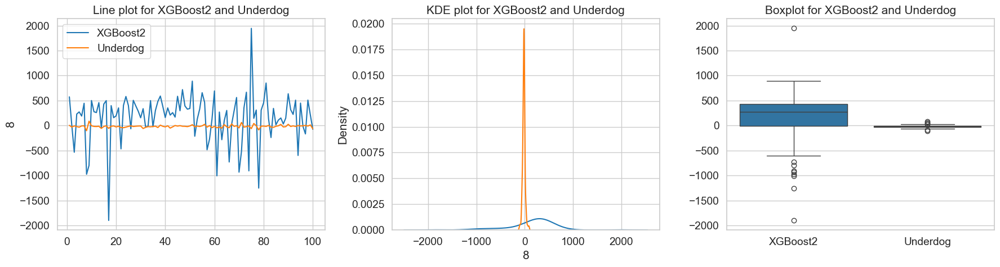

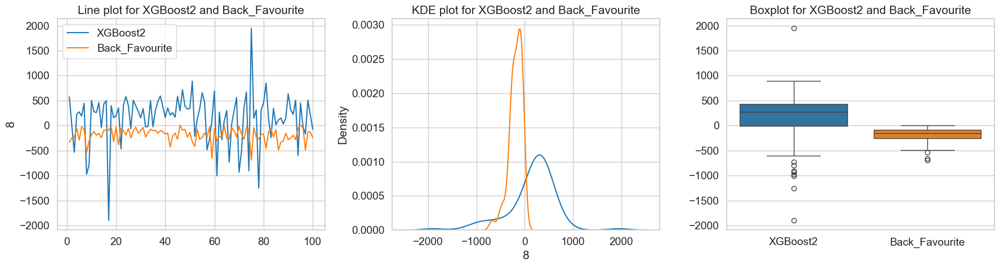

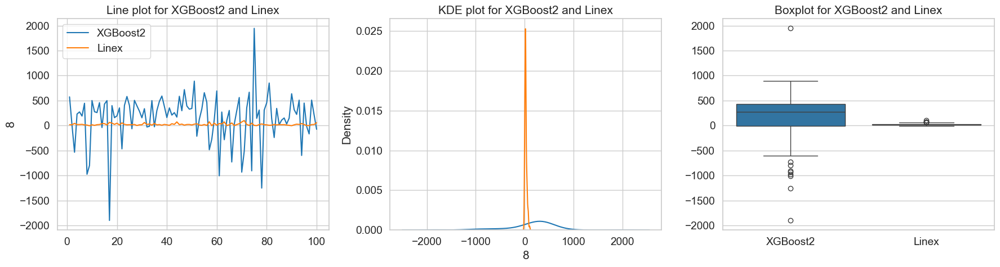

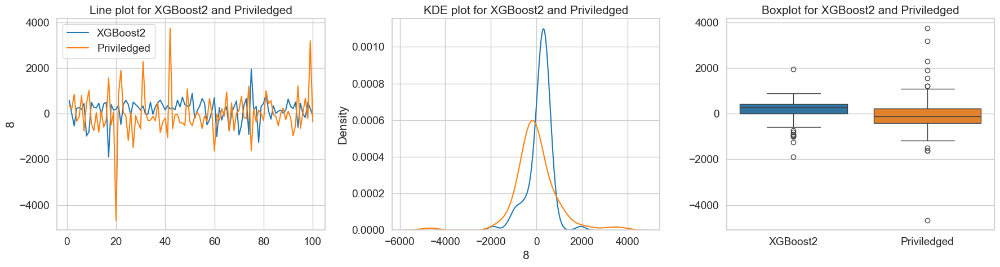

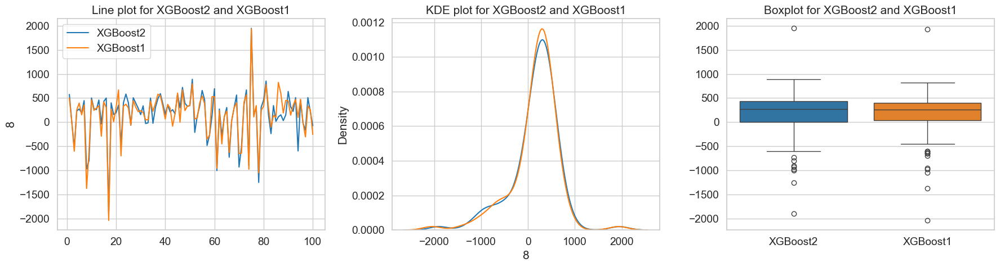

In [18]:
xgboost2_avg_balance = averaged_df.iloc[:, 7]  # XGBoost column

# Define agent names for easier access and readability
agent_names = ["Random", "Leader_Wins", "Underdog", "Back_Favourite", "Linex", "Priviledged", "XGBoost1"]

# Setting style and text scale for seaborn plots
sns.set_style("whitegrid")
sns.set_context("notebook", font_scale=1.25)  # Adjust the font_scale to increase text size

# Loop through columns 1-7 for other agents
for col_index in range(7):
    other_agent_balance = averaged_df.iloc[:, col_index]
    agent_name = agent_names[col_index]

    # Group the plots horizontally with modified height
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # Decreased the height from 6 to 5

    # Line plot for XGBoost and the other agent
    sns.lineplot(data=xgboost2_avg_balance, ax=axes[0], label='XGBoost2')
    sns.lineplot(data=other_agent_balance, ax=axes[0], label=agent_name)
    axes[0].set_title(f'Line plot for XGBoost2 and {agent_name}')

    # KDE plot for the distributions
    sns.kdeplot(xgboost2_avg_balance, ax=axes[1], label='XGBoost2')
    sns.kdeplot(other_agent_balance, ax=axes[1], label=agent_name)
    axes[1].set_title(f'KDE plot for XGBoost2 and {agent_name}')

    # Boxplot for the two distributions
    combined_data = pd.concat([xgboost2_avg_balance.rename('XGBoost2'), 
                               other_agent_balance.rename(agent_name)], axis=1)
    sns.boxplot(data=combined_data, ax=axes[2])
    axes[2].set_title(f'Boxplot for XGBoost2 and {agent_name}')
    
    plt.tight_layout()
    plt.show()